# Financial Stress Prediction Challenge

**Can you use mobile money transactions to spot early signs of financial hardship?**  

Mobile money is central to everyday financial life across Africa. It helps millions of households and small businesses receive income, send money, pay bills, access services, and manage day-to-day expenses.

But when financial pressure begins to build, customers often show early warning signs in their transaction behaviour before any formal default occurs. Detecting these signals early can help financial institutions provide timely support and reduce the risk of deeper financial hardship.

***Your task is to build a machine learning model that predicts which customers are likely to experience financial stress in the next 30 days, using six months of mobile money transaction history***.

### About
The dataset contains mobile money records over the previous six months. Each row represents a customer's recent activity at a specific date. Features include:

- Mobile money inflows and revenue
- Cash withdrawals and cash-out behaviour
- Balance levels and stability
- Merchant and bill payment activity
- Transaction frequency and account engagement
- The target variable indicates whether a customer experiences liquidity stress in the  30 days following the observation date.

A full description of variables is provided in data_dictionary.csv.

# 0. Business Understanding

#### **How Mobile Money businesses work?**

Mobile Money services allow users to store, transfer, and transact money digitally through a mobile wallet linked to their phone number, often without requiring a traditional bank account.

Users can typically:

- Send and receive P2P transfers
- Receive international remittances
- Pay bills
- Pay for goods and services at merchants
- Cash-in
- Cash-out
- Purchase airtime and mobile data

The Mobile Money provider generates revenue primarily by charging a transaction fee for certain services. Depending on the transaction type, the fee may be paid by the sender, recipient, merchant, or another participant in the ecosystem.

This creates a transaction-based business model **&rarr; the more users transact through the platform, and the higher the transaction value and frequency &rarr; the greater the provider's potential revenue.**

#### **How this intersects with our goal?**

Our goal is to **identify customers who are likely to experience financial stress within the following 30 days**, so that financial institutions and organizations can provide timely support to help prevent their financial situation from deteriorating further.

For people with limited financial resources, Mobile Money can be an important part of their everyday financial lives. Their transaction activity can therefore provide insights into how they manage their available resources, receive income, send or receive money, pay for essential goods and services, and access cash.

By analysing these behavioural patterns, we aim to identify early signs of financial stress before they become more severe.

The ultimate goal is not simply to make an accurate prediction, but to use data to help organizations better understand people's financial needs and provide support at the right time.

#### **Initial hypotheses**

Before analysing the data, we hypothesize that financial stress may manifest itself through changes in how customers receive, spend, and access money.

1. **Reduced spending on goods and services**
    - **Decrease in the value of goods and services payments**
    - **Decrease in the frequency of goods and services purchases**

***Rationale***: When facing financial pressure, customers may reduce discretionary consumption or purchase goods and services less frequently.

2. **Reduced bill payments**
    - **Decrease in the value of bill payments**

***Rationale***: Customers experiencing financial difficulties may reduce their consumption of utilities and other services, leading to lower bill payments.

3. **Reduced cash inflows**
    - **Decrease in Cash-In**

***Rationale***: A decrease in cash deposits may indicate reduced access to cash income or other sources of funds.

4. **Increased cash withdrawals**
    - **Increase in Cash-Out**

***Rationale***: Customers experiencing financial stress may increase their cash withdrawals as a way of accessing immediate liquidity.

5. **Increased reliance on external financial support**
    - **Increase in incoming transfers from external customers**

***Rationale***: Customers experiencing financial difficulties may increasingly rely on financial support from family members, friends, or other individuals, resulting in an increase in incoming P2P transfers.

6. **Behavioural deterioration**
    - **Behavioural deterioration over time**

***Rationale***: Customers who experience financial stress may show a deterioration in their financial behaviour over the months preceding the stress event.

# 1. Imports

In [2]:
# Utility libraries
import re
from IPython.display import HTML, display
from scipy.stats import trim_mean
from scipy.stats import mannwhitneyu, levene

#Functions
from utils import *
from plot import *

# Data manipulation
import pandas as pd
import numpy as np

# Data visualization
import matplotlib.pyplot as plt
import seaborn as sns

# Data preprocessing
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.compose import ColumnTransformer, make_column_selector
from sklearn.pipeline import Pipeline

# Model selection
from sklearn.model_selection import train_test_split

# Models
import xgboost as xgb
from xgboost import plot_importance
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA

# Model evaluation
from sklearn import metrics
from sklearn.metrics import roc_auc_score

# Model interpretability
import shap

# General configuration

pd.set_option('display.max_columns', None)

display(
    HTML("""
    <style>
    .output_png {
        display: flex;
        align-items: center;
        justify-content: center;
    }
    </style>
""")
)

TARGET = "liquidity_stress_next_30d"
ID = "ID"


/home/adriavinias/.venv/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# 2. Data Loading

In [3]:
# train dataset
train = pd.read_csv("./data/Train.csv")
# test dataset
test = pd.read_csv("./data/Test.csv")
#dictionary
dic = pd.read_csv("./data/data_dictionary.csv")

extra = pd.read_csv("data/indicators_tza.csv")

#### Extracting features

In [4]:
f_tr = getFeatures(train, [TARGET, ID])
f_ts = getFeatures(test, [ID])

# 3. EDA

### 3.1 Feature Groups

In [5]:
# W I P
kinds_of_features = dic.groupby("feature_group").size()
df_features = pd.DataFrame({"feature_group": kinds_of_features.index, "num_of_features": kinds_of_features.values})
df_features

,feature_group,num_of_features
0,activity,1
1,balance,6
2,behaviour,168
3,customer_profile,7
4,identifier,1
5,target,1


From the feature dictionary we've been provided we can see that the feature collection is formed by 6 groups:

- ***activity***, captures the customer's rate of Mobile Money activity over a 90-day window
- ***balance***, captures the customer's avg daily mobile money balance accross 6 months, from m1 &rarr; m6
- ***behaviour***, captures how the customer interacts with different actors within the Mobile Money ecosystem,  
        including transaction volume, maximum transaction value,  
        total transaction value, and the  number of unique agents, measured from m1 &rarr; m6
- ***customer_profile***, captures customer characteristics, such as age, region, segment, earning pattern, gender, and ARPU
- ***identifier***, contains the ID associated with each customer snapshot
- ***target***, contains the outcome we aim to predict: whether the customer will experience financial stress


### 3.2 Data Quality

In [6]:
smallEDA(train, f_tr)

feature,arpu,age,gender,region,smartphone,segment,earning_pattern,x_90_d_activity_rate,m1_paybill_volume,m1_paybill_total_value,m1_paybill_highest_amount,m1_paybill_companies,m2_paybill_volume,m2_paybill_total_value,m2_paybill_highest_amount,m2_paybill_companies,m3_paybill_volume,m3_paybill_total_value,m3_paybill_highest_amount,m3_paybill_companies,m4_paybill_volume,m4_paybill_total_value,m4_paybill_highest_amount,m4_paybill_companies,m5_paybill_volume,m5_paybill_total_value,m5_paybill_highest_amount,m5_paybill_companies,m6_paybill_volume,m6_paybill_total_value,m6_paybill_highest_amount,m6_paybill_companies,m1_merchantpay_volume,m1_merchantpay_total_value,m1_merchantpay_highest_amount,m1_merchantpay_merchants,m2_merchantpay_volume,m2_merchantpay_total_value,m2_merchantpay_highest_amount,m2_merchantpay_merchants,m3_merchantpay_volume,m3_merchantpay_total_value,m3_merchantpay_highest_amount,m3_merchantpay_merchants,m4_merchantpay_volume,m4_merchantpay_total_value,m4_merchantpay_highest_amount,m4_merchantpay_merchants,m5_merchantpay_volume,m5_merchantpay_total_value,m5_merchantpay_highest_amount,m5_merchantpay_merchants,m6_merchantpay_volume,m6_merchantpay_total_value,m6_merchantpay_highest_amount,m6_merchantpay_merchants,m1_transfer_from_bank_volume,m1_transfer_from_bank_total_value,m1_transfer_from_bank_highest_amount,m1_transfer_from_bank_banks,m2_transfer_from_bank_volume,m2_transfer_from_bank_total_value,m2_transfer_from_bank_highest_amount,m2_transfer_from_bank_banks,m3_transfer_from_bank_volume,m3_transfer_from_bank_total_value,m3_transfer_from_bank_highest_amount,m3_transfer_from_bank_banks,m4_transfer_from_bank_volume,m4_transfer_from_bank_total_value,m4_transfer_from_bank_highest_amount,m4_transfer_from_bank_banks,m5_transfer_from_bank_volume,m5_transfer_from_bank_total_value,m5_transfer_from_bank_highest_amount,m5_transfer_from_bank_banks,m6_transfer_from_bank_volume,m6_transfer_from_bank_total_value,m6_transfer_from_bank_highest_amount,m6_transfer_from_bank_banks,m1_mm_send_volume,m1_mm_send_total_value,m1_mm_send_highest_amount,m1_mm_send_recipients,m2_mm_send_volume,m2_mm_send_total_value,m2_mm_send_highest_amount,m2_mm_send_recipients,m3_mm_send_volume,m3_mm_send_total_value,m3_mm_send_highest_amount,m3_mm_send_recipients,m4_mm_send_volume,m4_mm_send_total_value,m4_mm_send_highest_amount,m4_mm_send_recipients,m5_mm_send_volume,m5_mm_send_total_value,m5_mm_send_highest_amount,m5_mm_send_recipients,m6_mm_send_volume,m6_mm_send_total_value,m6_mm_send_highest_amount,m6_mm_send_recipients,m1_received_volume,m1_received_total_value,m1_received_highest_amount,m1_received_senders,m2_received_volume,m2_received_total_value,m2_received_highest_amount,m2_received_senders,m3_received_volume,m3_received_total_value,m3_received_highest_amount,m3_received_senders,m4_received_volume,m4_received_total_value,m4_received_highest_amount,m4_received_senders,m5_received_volume,m5_received_total_value,m5_received_highest_amount,m5_received_senders,m6_received_volume,m6_received_total_value,m6_received_highest_amount,m6_received_senders,m1_deposit_volume,m1_deposit_total_value,m1_deposit_highest_amount,m1_deposit_agents,m2_deposit_volume,m2_deposit_total_value,m2_deposit_highest_amount,m2_deposit_agents,m3_deposit_volume,m3_deposit_total_value,m3_deposit_highest_amount,m3_deposit_agents,m4_deposit_volume,m4_deposit_total_value,m4_deposit_highest_amount,m4_deposit_agents,m5_deposit_volume,m5_deposit_total_value,m5_deposit_highest_amount,m5_deposit_agents,m6_deposit_volume,m6_deposit_total_value,m6_deposit_highest_amount,m6_deposit_agents,m1_withdraw_volume,m1_withdraw_total_value,m1_withdraw_highest_amount,m1_withdraw_agents,m2_withdraw_volume,m2_withdraw_total_value,m2_withdraw_highest_amount,m2_withdraw_agents,m3_withdraw_volume,m3_withdraw_total_value,m3_withdraw_highest_amount,m3_withdraw_agents,m4_withdraw_volume,m4_withdraw_total_value,m4_withdraw_highest_amount,m4_withdraw_agents,m5_withdraw_volume,m5_withdraw_total_value,m5_withdra

##### ***Key insights***:

1. Total number of observations/customers on TRAINING dataset: 40000
2. Total number of features, excluding TARGET: 183
3. Number of nulls: 0
4. Number of duplicated observations: 0
5. Number of categorical features: 6
6. Number of numerical features, excluding TARGET: 177
7. High prevalence of zero values across many behavioural features.
Many behavioural variables have a median of 0 and more than 50% of observations equal to 0, suggesting low participation in several types of Mobile Money transactions. Therefore, for these zero-inflated features, we will distinguish between:
 - ***Participation***: the proportion of customers with a value greater than 0.
 - ***Intensity***: the distribution of the variable among customers who have a value greater than 0.


### 3.3 Target Distribution

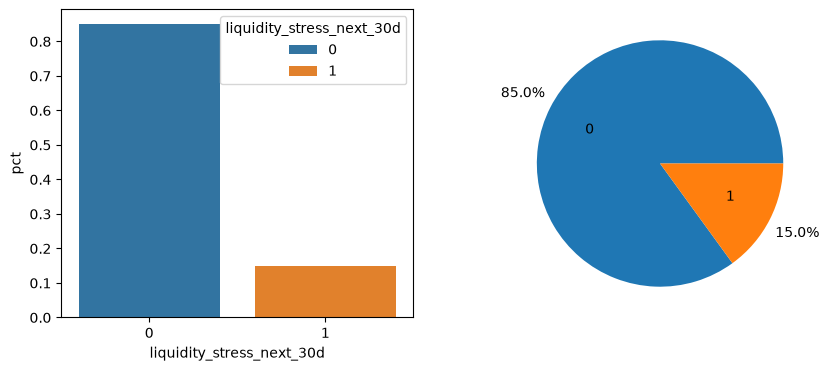

In [7]:
fig, axes = plt.subplots(1,2,figsize=(10,4))
count = train.groupby(TARGET).size().reset_index(name="count")
count["pct"] = count["count"]/len(train)


sns.barplot(data=count, x=TARGET, y="pct", hue=TARGET, ax=axes[0])
axes[1].pie(x=count["pct"], labels=[0,1], autopct='%1.1f%%',  pctdistance=1.25, labeldistance=.6)

***Key insights***: Our target variable is imbalanced, as most customers are not expected to experience financial stress in the following 30 days.

### 3.4 Univariate Analysis stratified by the target

Before analysing relationships between features, we first examine the distribution of the variables within each feature group. This allows us to understand their scale, dispersion, skewness, and the presence of potential outliers. 

For behavioural features, we first examine customer participation to determine which transaction types are used by a substantial proportion of customers. This is particularly relevant given the high prevalence of zero values observed in several behavioural variables.

We then analyse the distributions of these variables stratified by the target.

#### 3.4.1 Customer profile

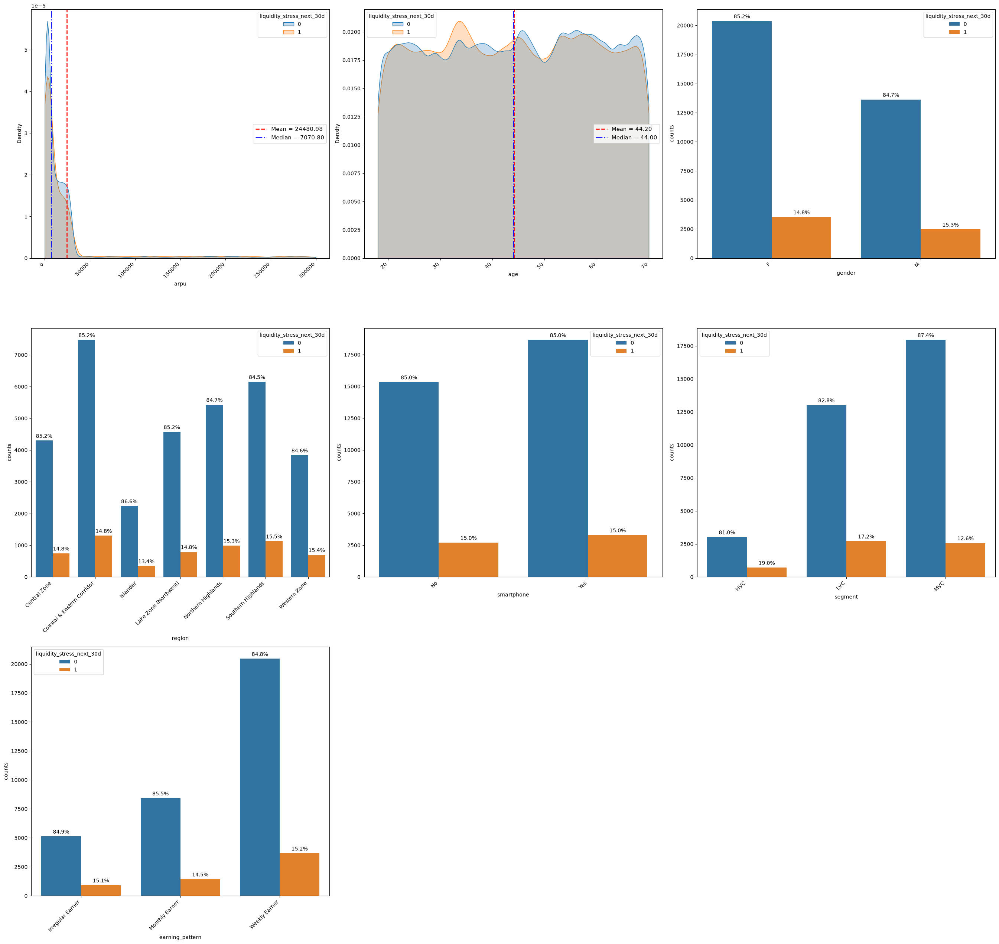

In [8]:
group = "customer_profile"
plot(train, dic, group)


##### ***Key insights***:


1. *arpu*: Customers experiencing financial stress tend to have lower ARPU than customers who do not experience financial stress.
2. *age*: Customers experiencing financial stress tend to have a lower median age and therefore appear to be younger than customers without financial stress. The age feature ranges from 18 to 70 years old, so it could be useful to group customers into age bands and examine whether financial stress varies across age groups.
3. *gender*: There are more female customers than male customers in the dataset. However, the proportion of financially stressed customers is higher among males. It would be interesting to further investigate how customers of different genders interact with the Mobile Money ecosystem—for example, whether there are differences in their patterns of sending and receiving money.
4. *region*: The Coastal Region contains the largest number of customers. It would be interesting to examine how the different customer segments (HVC, MVC, and LVC) are distributed across regions and whether some regions have a higher concentration of particular segments.
5. *smartphone*: Most customers in the dataset have a smartphone. However, the proportion of financially stressed customers is higher among customers without a smartphone. This could potentially be associated with factors such as income levels, access to technology, or geographic location, particularly in rural areas. These relationships would need to be investigated rather than assumed.
6. *segment*: MVC is the largest customer segment by number of customers. However, LVC has the highest proportion of customers experiencing financial stress. This suggests that customer segment may be an important variable to investigate further.
7. *earning_pattern*: The most common earning pattern is Weekly. Among the different earning patterns, Irregular earners have the highest proportion of customers experiencing financial stress. This may indicate a relationship between income regularity and financial stress.

#### 3.4.2 Activity

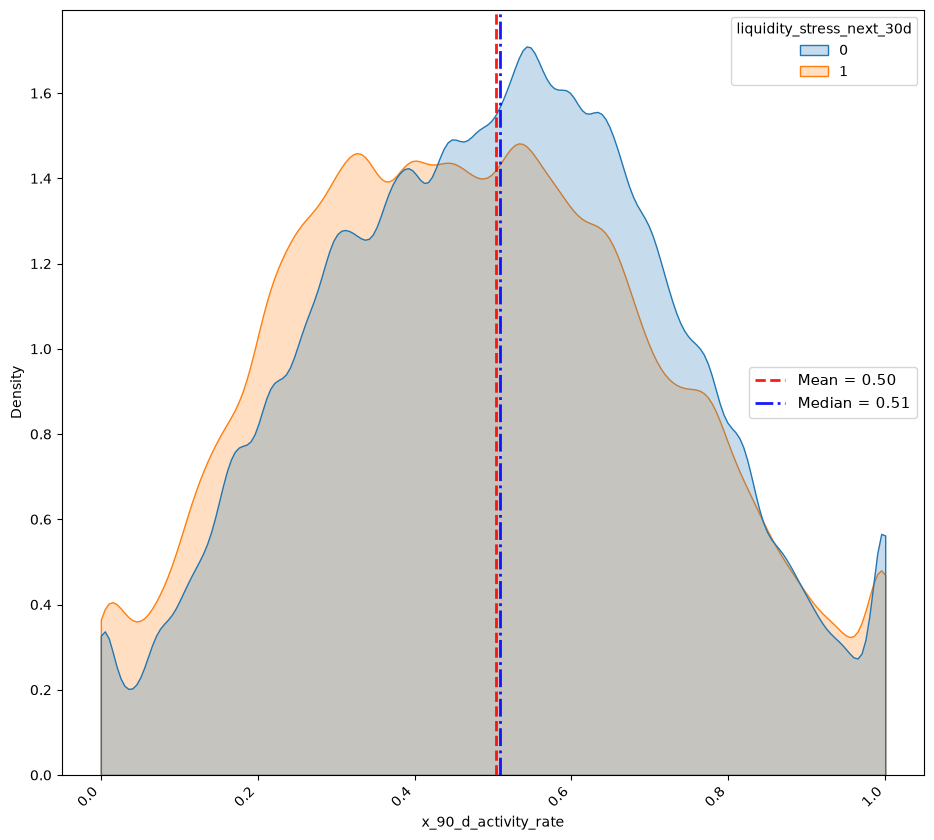

In [9]:
group = "activity"
plot(train, dic, group)

***Key insights:***

This suggests that customers who experience financial stress tend to use the app less frequently.

#### 3.4.3 Balance

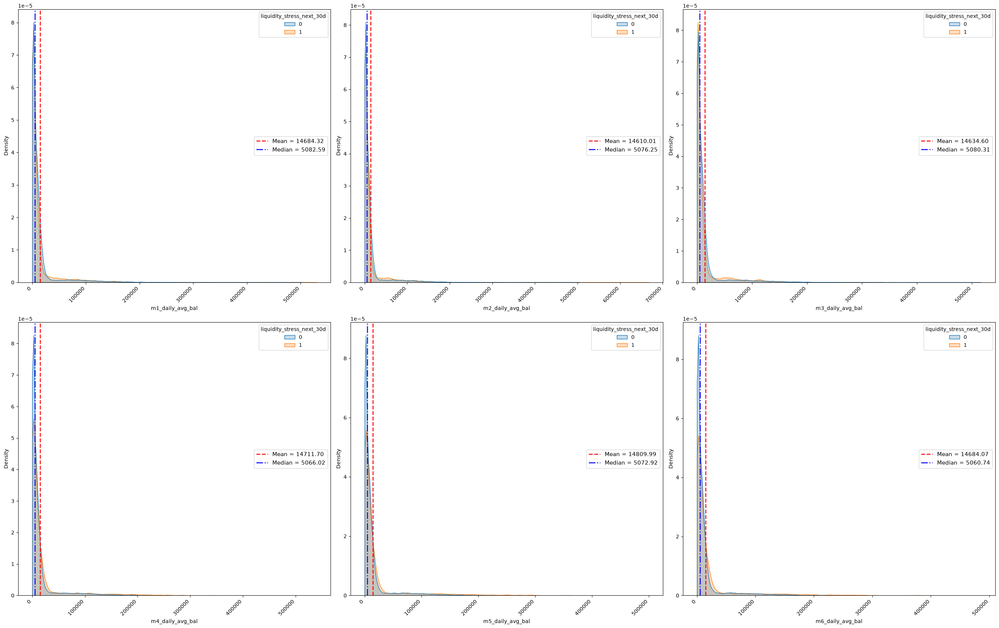

In [10]:
group = "balance"
plot(train, dic, group)

***Key insights***:

In [11]:
behaviour_ft = dic[dic["feature_group"] == "behaviour"]["column_name"].reset_index(drop=True).values

# Original criterion: overall zero rate > 50% across the full column (both
# target classes pooled). Catches merchantpay/paybill/transfer_from_bank.
global_zero_rate = (train[behaviour_ft] == 0).mean()

# Additional criterion: some groups (deposit) don't reach 50% zero rate on
# average, but become substantially inactive specifically within target=1 as
# the stress window approaches (see 3.5.3) -- a single global-average
# threshold misses that escalation, since each column here is already one
# specific month, this checks per-month inactivity within target=1 directly.
target1_zero_rate = (train.loc[train[TARGET] == 1, behaviour_ft] == 0).mean()

zero_inflation_features = [
    col for col in behaviour_ft
    if global_zero_rate[col] > 0.5 or target1_zero_rate[col] > 0.4
]

# Robust action -> prefix extraction (fixes "transfer" vs "transfer_from_bank"
# mismatch that a plain substring list produces).
known_suffixes = [
    "volume", "total_value", "highest_amount",
    "merchants", "companies", "agents", "recipients", "senders", "banks"
]
action_prefix_pattern = re.compile(rf"^m\d+_(.+)_(?:{'|'.join(known_suffixes)})$")
actions = sorted({
    m.group(1) for col in zero_inflation_features
    if (m := action_prefix_pattern.match(col))
})
actions


['deposit',
 'merchantpay',
 'mm_send',
 'paybill',
 'received',
 'transfer_from_bank',
 'withdraw']

#### 3.4.4 Behaviour

Behavourial feature distributions

##### 3.4.4.1 Goods, services & Merchant payments

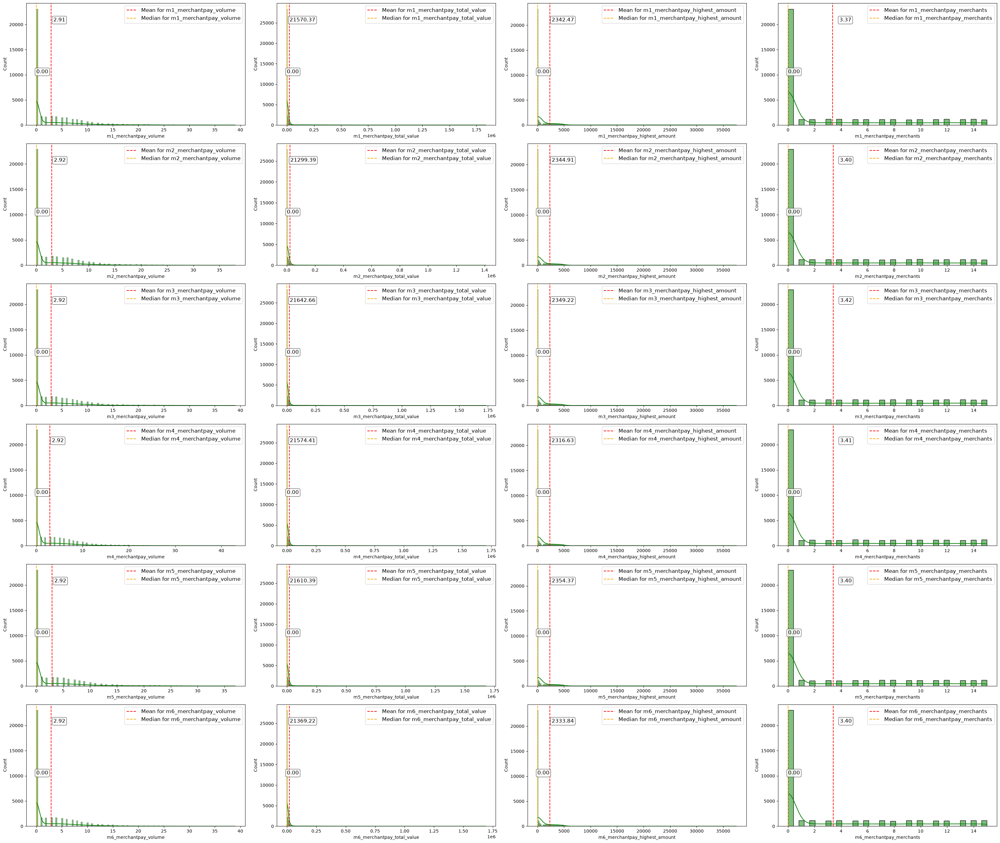

In [12]:
plot_kde_grid(train, "merchantpay")

- Low penetration on merchantpay
- Positively skewed distributions

##### 3.4.4.2 Bill payments

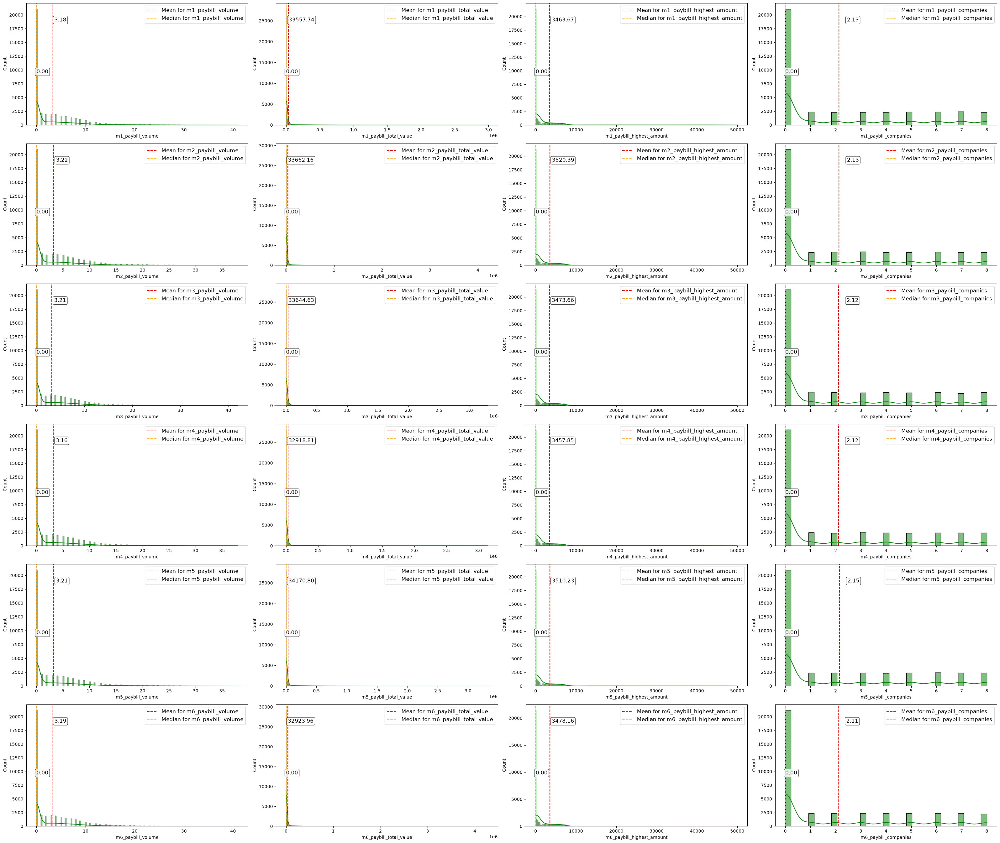

In [13]:
plot_kde_grid(train, "paybill")

- Low penetration on paybill features
- Positively skewed features


##### 3.4.4.3 Cash-In

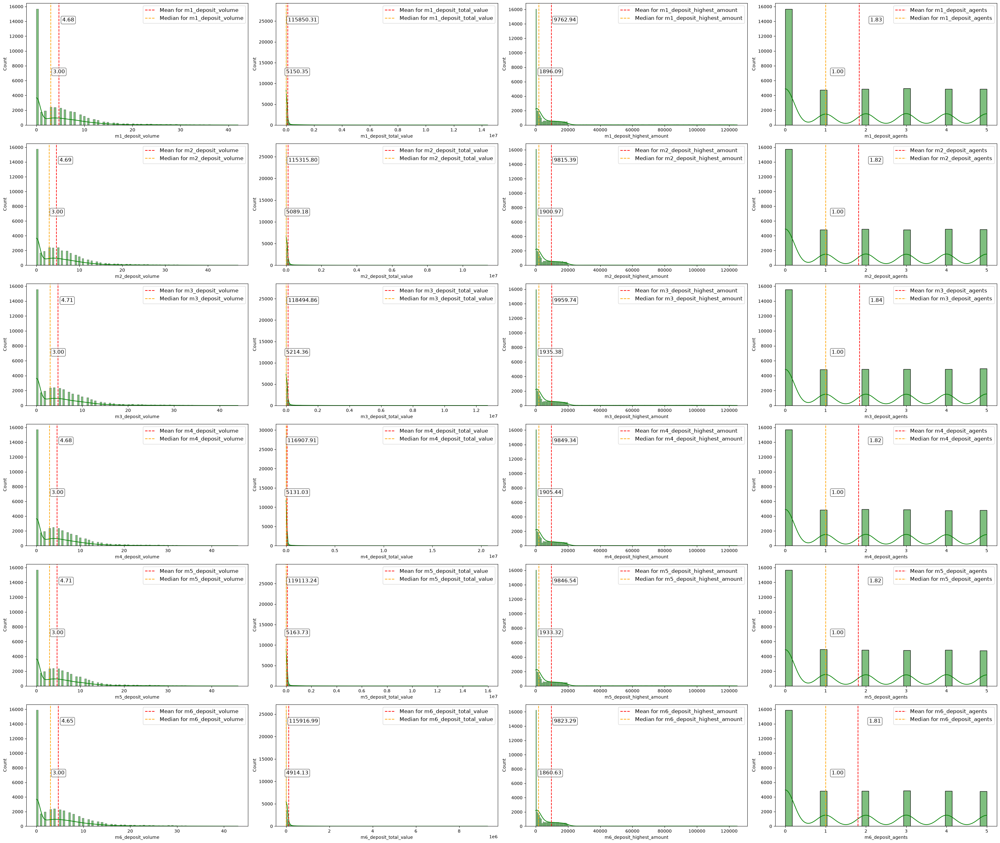

In [14]:
plot_kde_grid(train, "deposit")

- `deposit` doesn't reach the 50% global zero-rate threshold on average, but its inactivity within target=1 climbs sharply in the months closest to the stress window (examined below, and further in 3.5.3).

##### 3.4.4.4 Cash-out

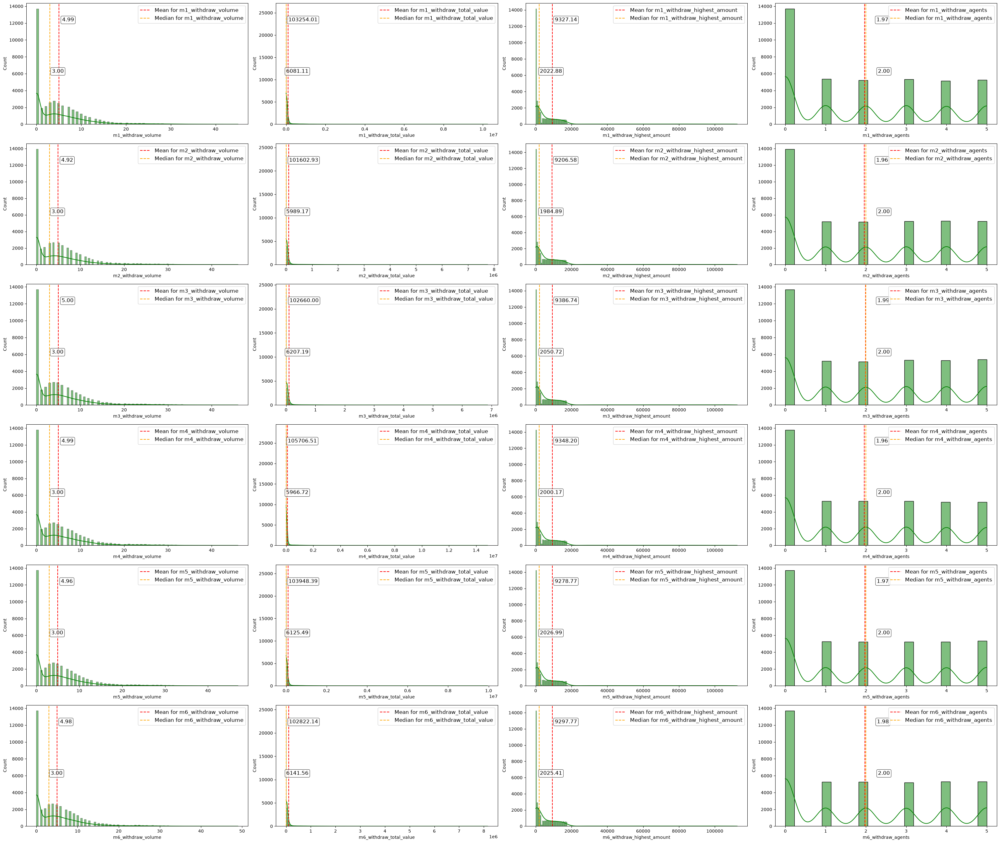

In [15]:
plot_kde_grid(train, "withdraw")

##### 3.4.4.5 Money sent

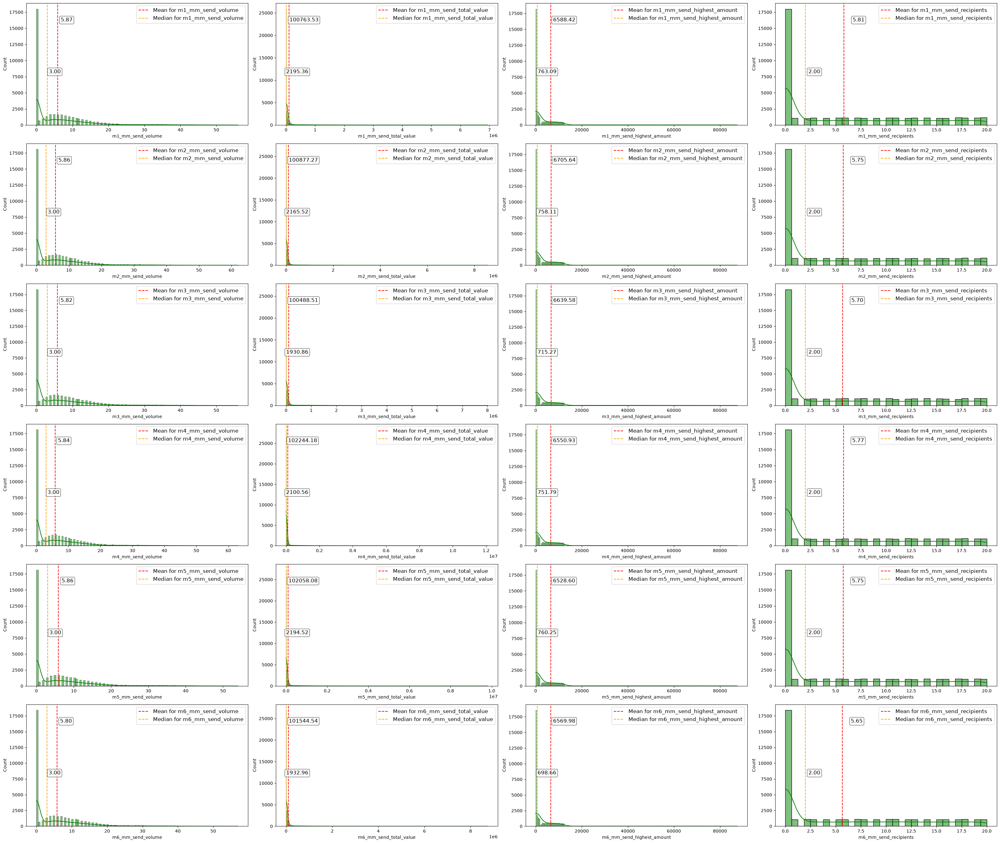

In [16]:
plot_kde_grid(train, "mm_send")

##### 3.4.4.6 Received

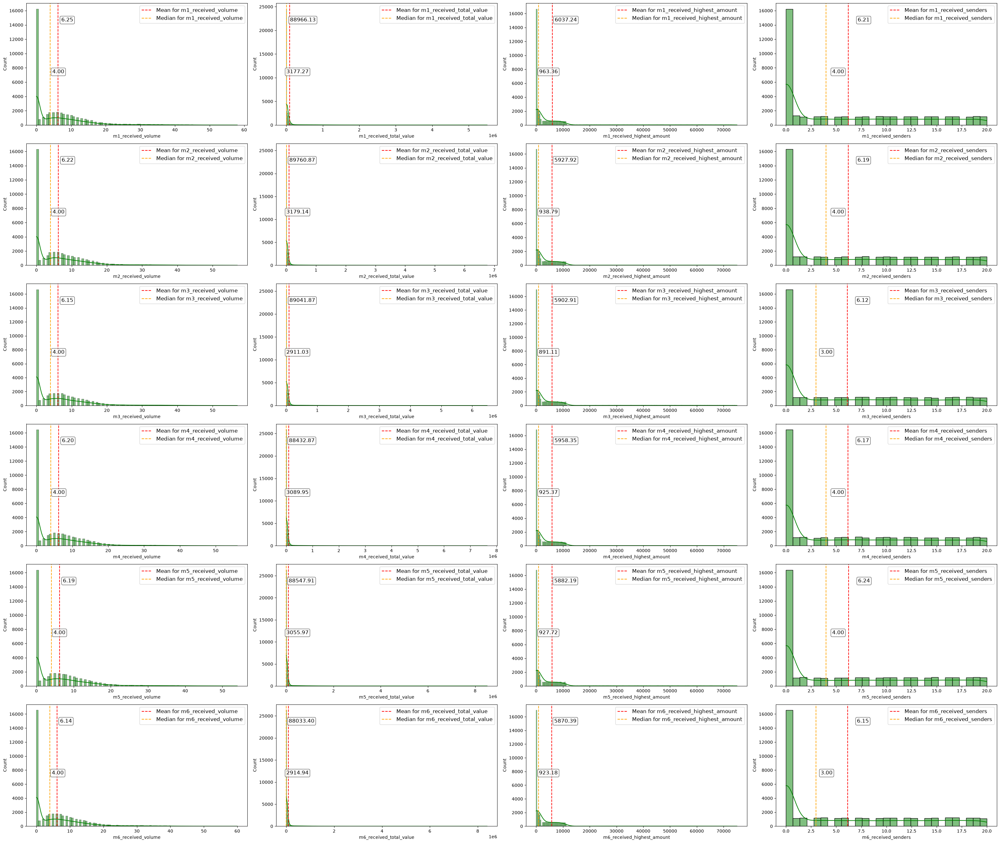

In [17]:
plot_kde_grid(train, "received")

##### 3.4.4.7 Bank transfers

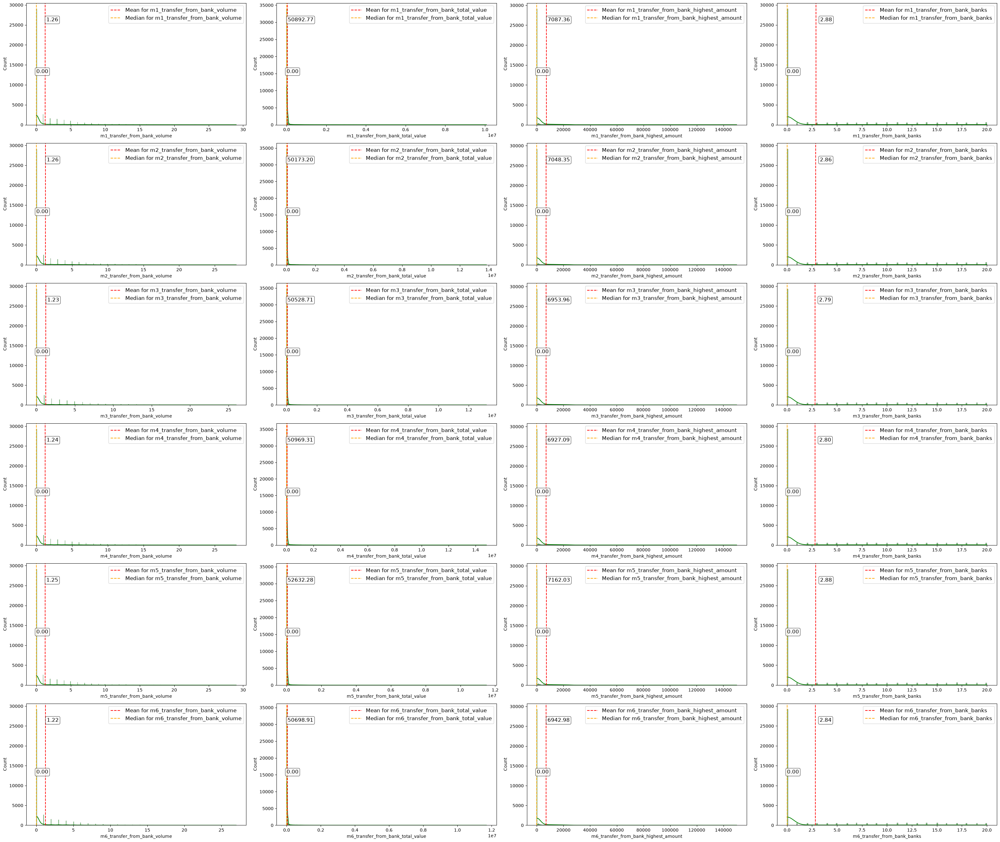

In [18]:
plot_kde_grid(train, "transfer")

- Low penetration on transfer_from_bank
- Positively skewed distribution

#### Customer participation

Given the high prevalence of zero values across several behavioural features, grouped into four action categories — **merchantpay**, **paybill**, **bank transfers**, and **deposit** (the latter flagged not by its overall average, but by a sharp rise in inactivity specifically within target=1 -- see above) — we will examine two aspects of customer behaviour:

 - ***Participation***: the proportion of customers who actively use each transaction type (value > 0).
 - ***Intensity***: among participating customers, the level and distribution of their transaction activity.

This allows us to distinguish between whether customers use a particular service and how intensively they use it.

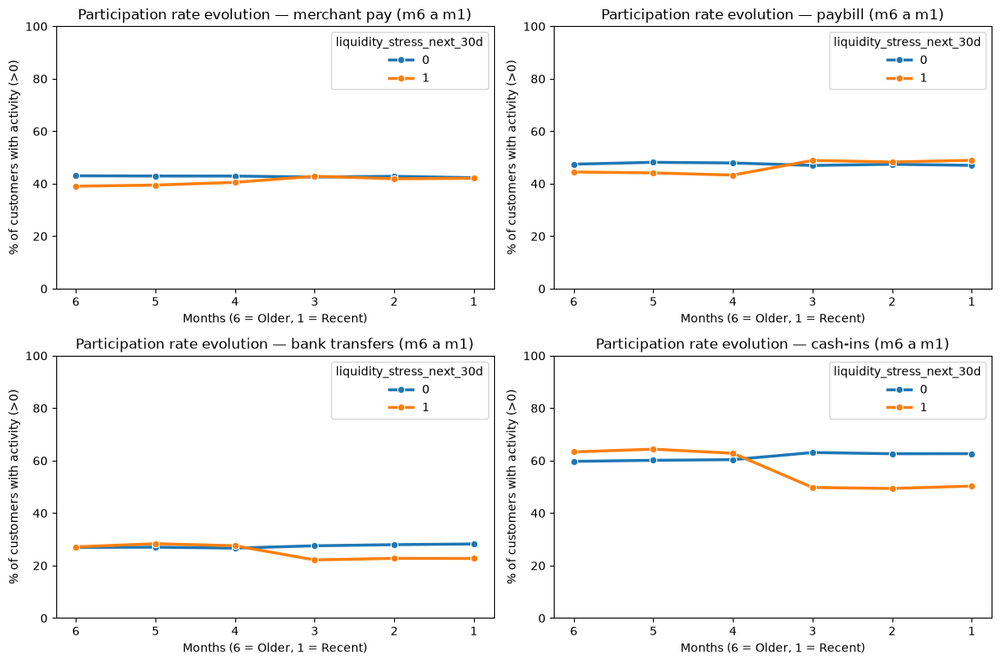

In [19]:
fig, ax = plt.subplots(2,2, figsize=(12,8))
ax = ax.flatten()
plot_participation_evolution(train, "merchantpay", participation_col="volume", title="merchant pay", ax=ax[0])
plot_participation_evolution(train, "paybill", participation_col="volume", title="paybill",ax =ax[1])
plot_participation_evolution(train, "transfer_from_bank", participation_col="volume", title="bank transfers", ax=ax[2])
plot_participation_evolution(train, "deposit", participation_col="volume", title="cash-ins", ax=ax[3])
plt.tight_layout()

Plot for low penetration actions, we only take those customers who really participate

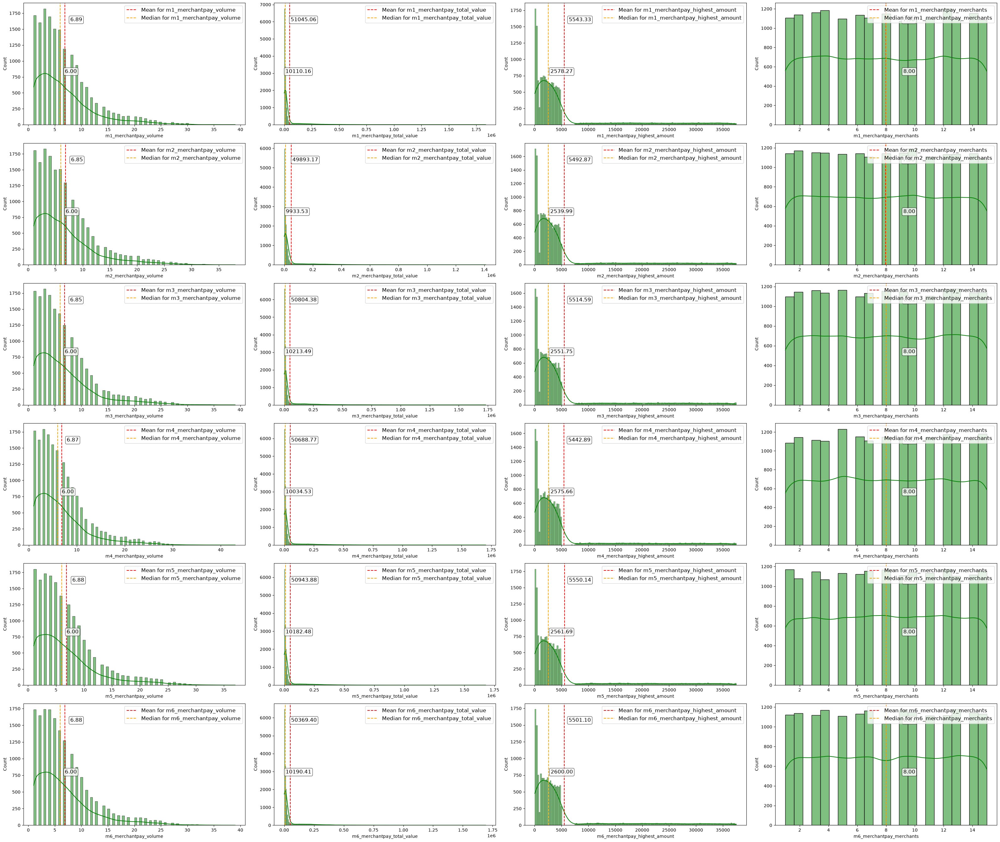

In [20]:
plot_kde_grid(train, "merchantpay", cut=True)

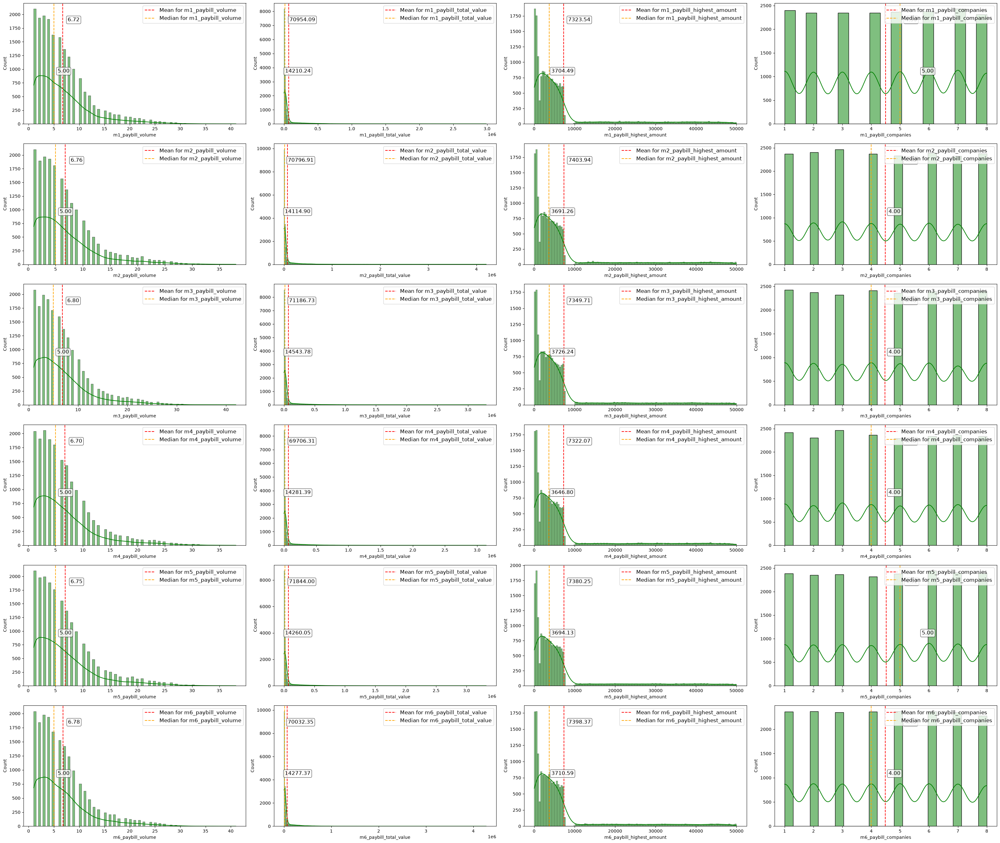

In [21]:
plot_kde_grid(train, "paybill", cut=True)

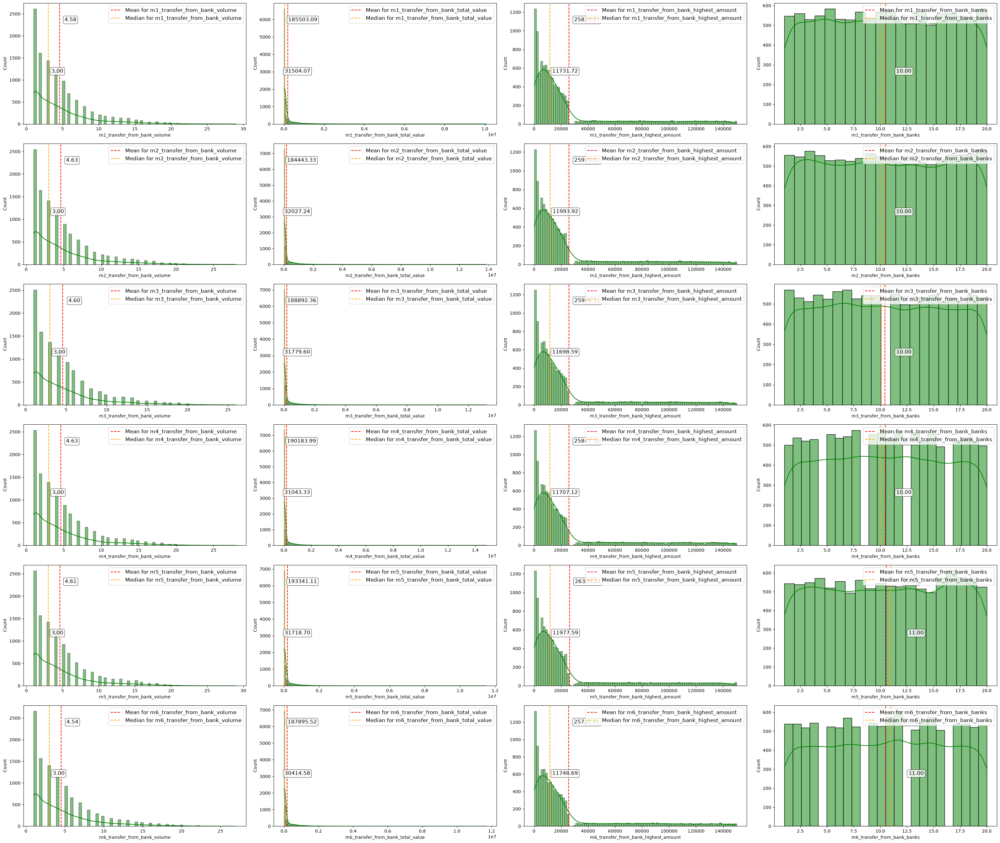

In [22]:
plot_kde_grid(train, "transfer_from_bank", cut=True)

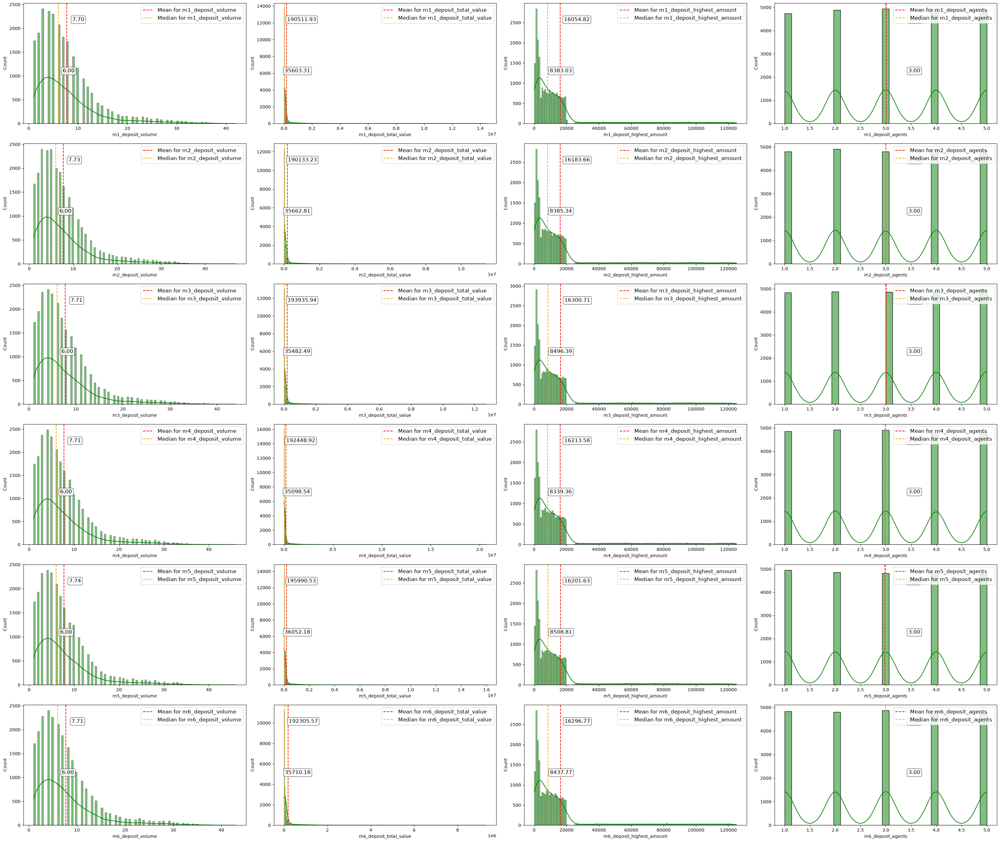

In [23]:
plot_kde_grid(train, "deposit", cut=True)


### 3.5 Behavioural Evolution

#### 3.5.1 Goods, services & Merchant pay

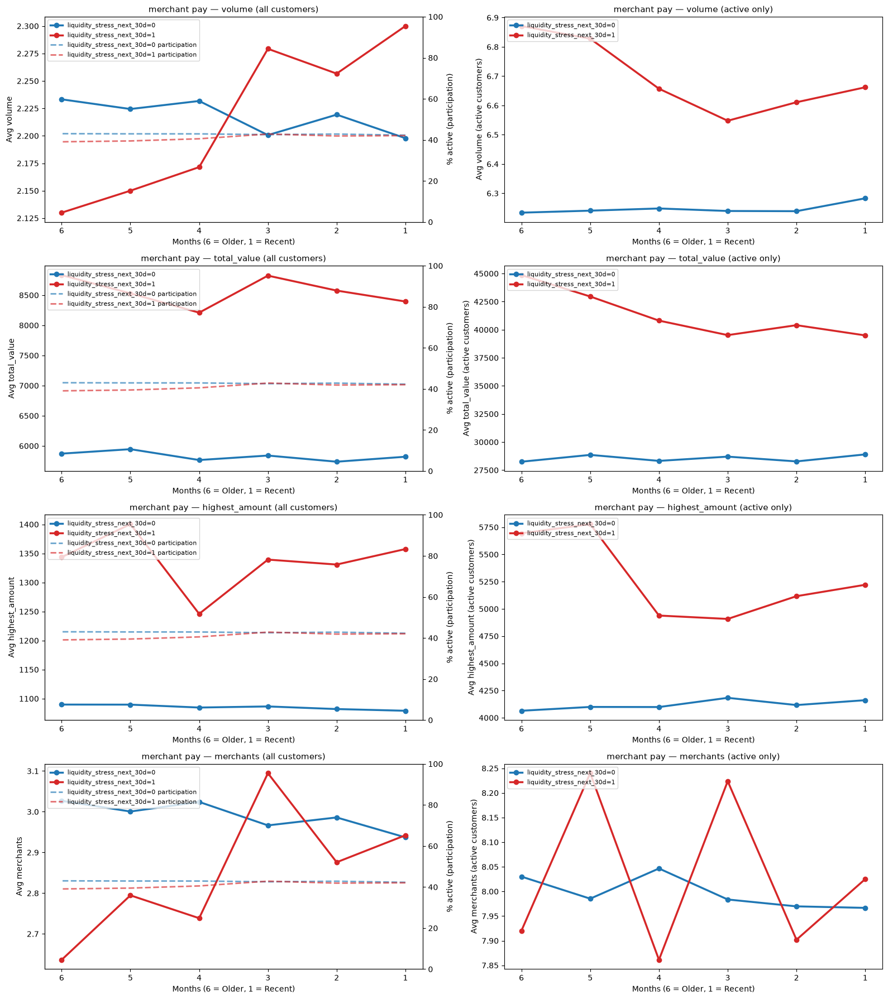

In [24]:
plot_monthly_evolution_v2(train, "merchantpay", ["volume", "total_value", "highest_amount", "merchants"], title="merchant pay")

#### 3.5.2 Bill payments

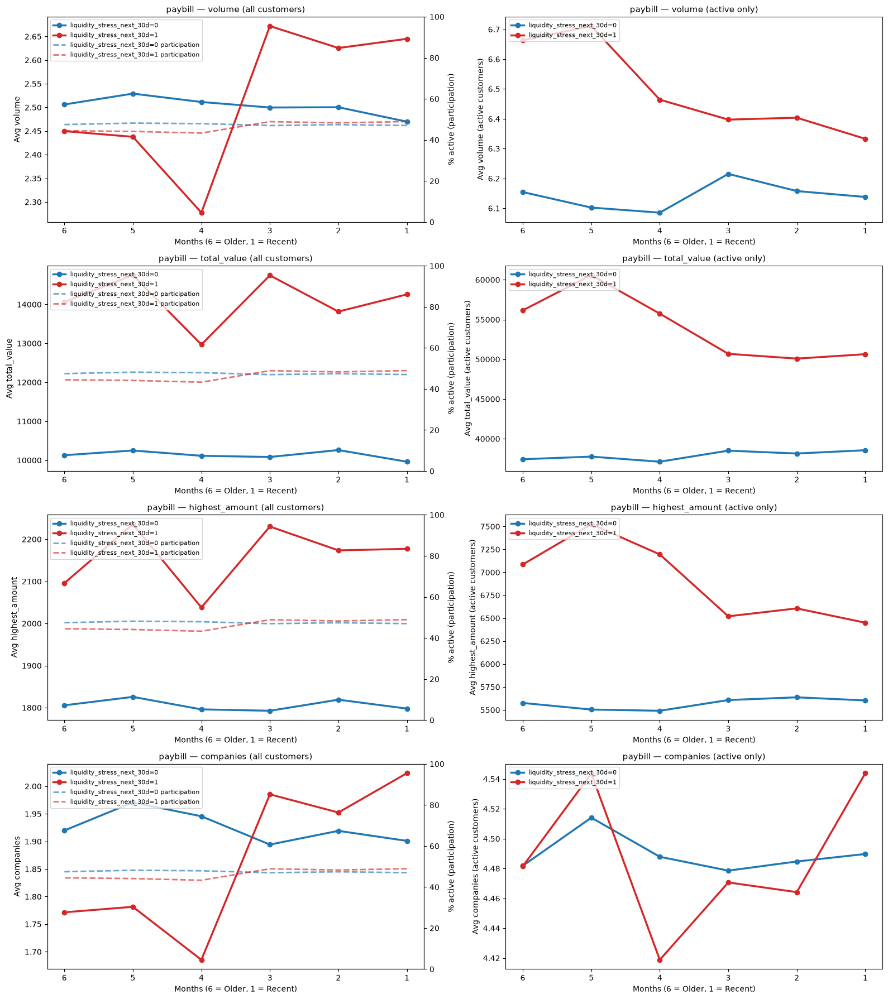

In [25]:
plot_monthly_evolution_v2(train, "paybill", ["volume", "total_value", "highest_amount", "companies"], title="paybill")

#### 3.5.3 Cash-in

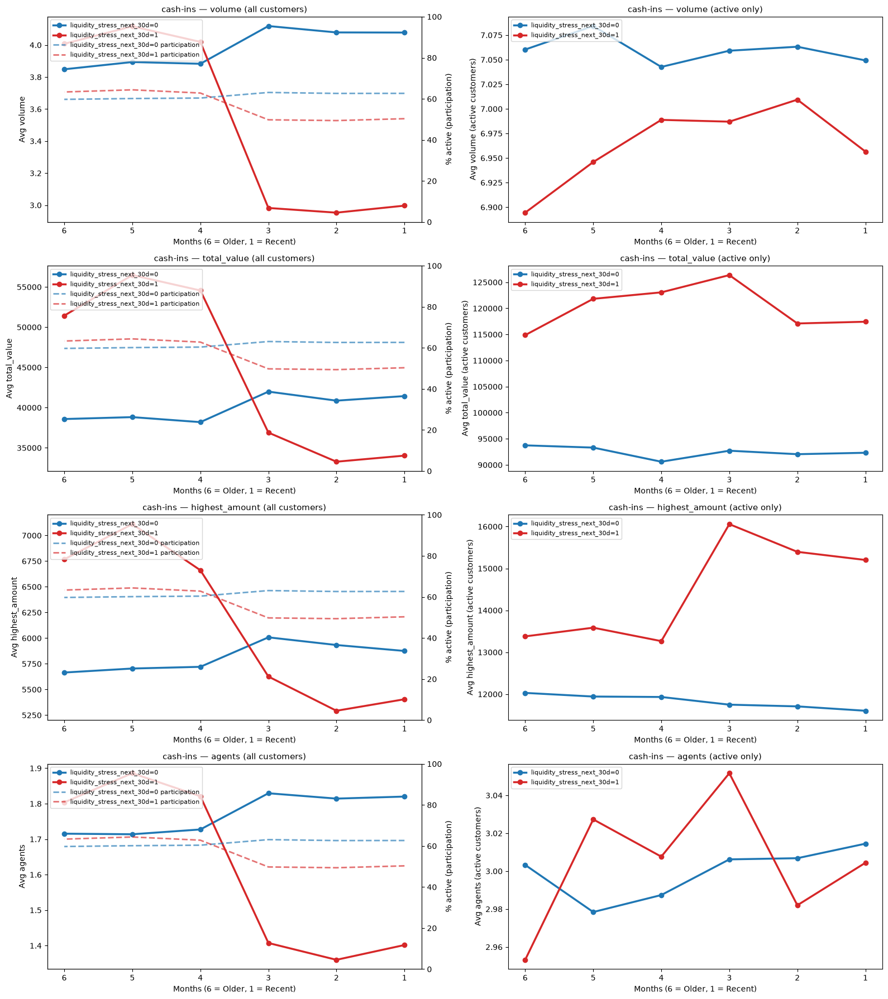

In [26]:
plot_monthly_evolution_v2(train, "deposit", ["volume", "total_value", "highest_amount", "agents"], title="cash-ins")

#### 3.5.4 Cash-out

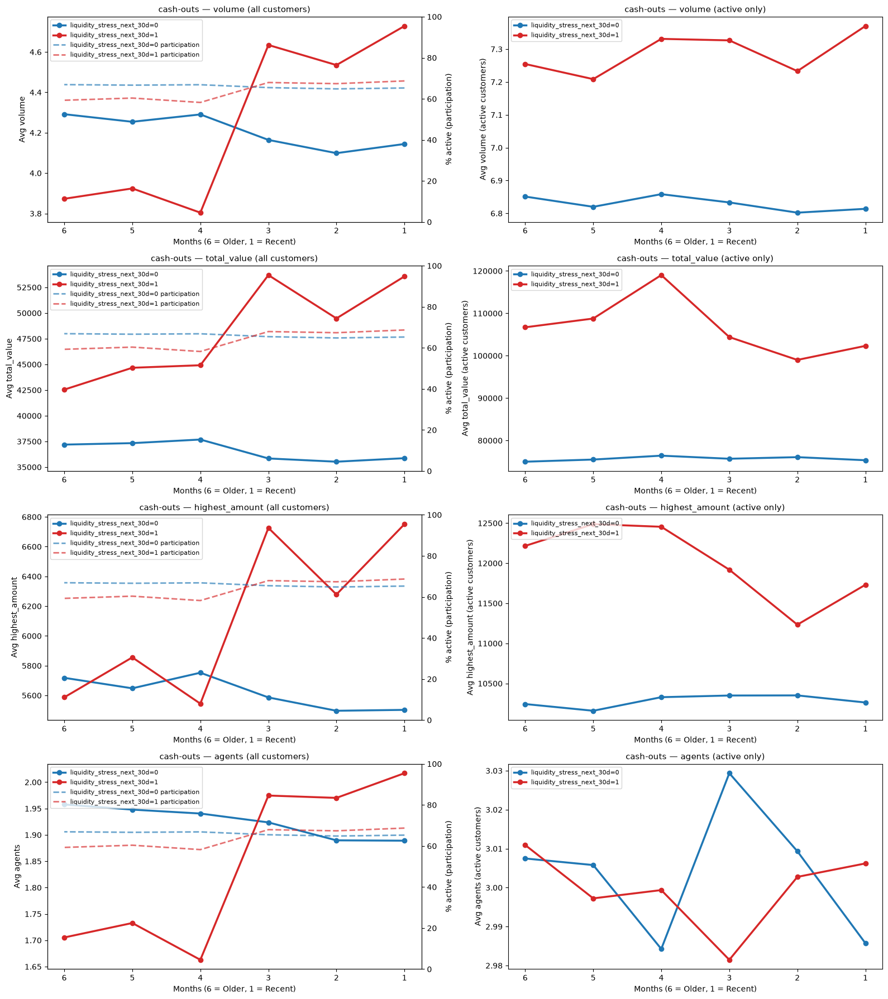

In [27]:
plot_monthly_evolution_v2(train, "withdraw", ["volume", "total_value", "highest_amount", "agents"], title="cash-outs")

#### 3.5.5 Money sent

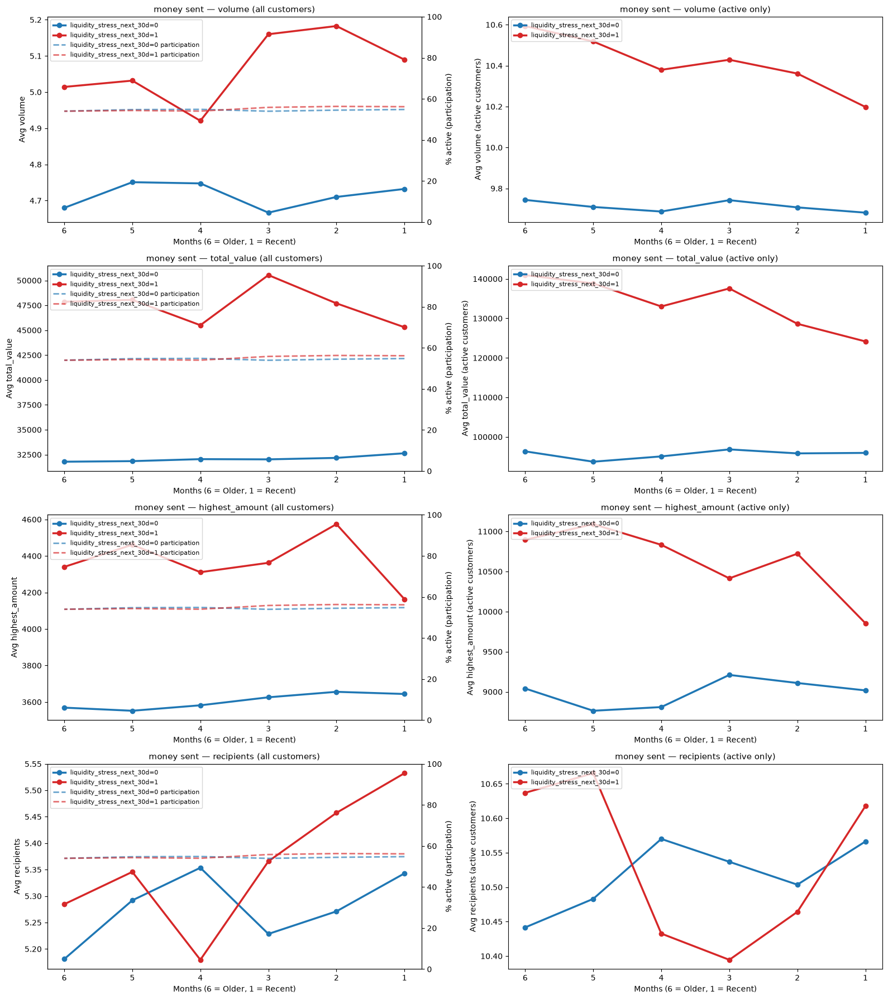

In [28]:
plot_monthly_evolution_v2(train, "mm_send", ["volume", "total_value", "highest_amount", "recipients"], title="money sent")

#### 3.5.6 Received

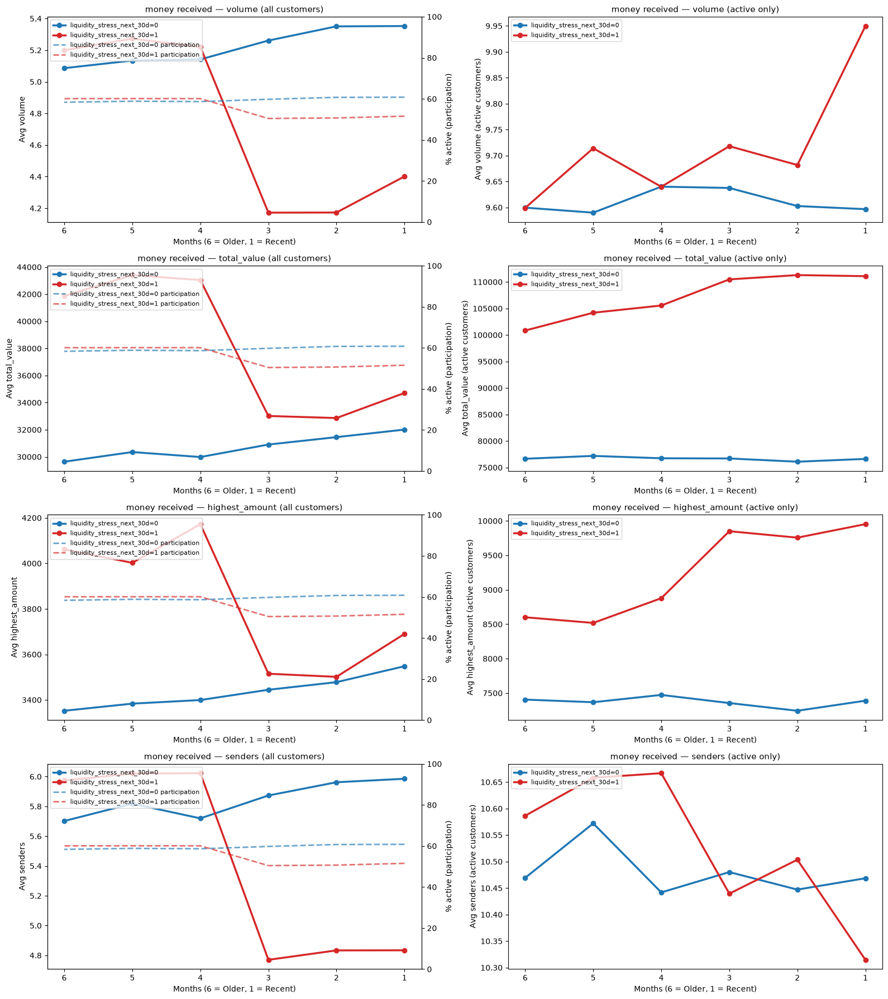

In [29]:
plot_monthly_evolution_v2(train, "received", ["volume", "total_value", "highest_amount", "senders"], title="money received")

#### 3.5.7 Bank transfers

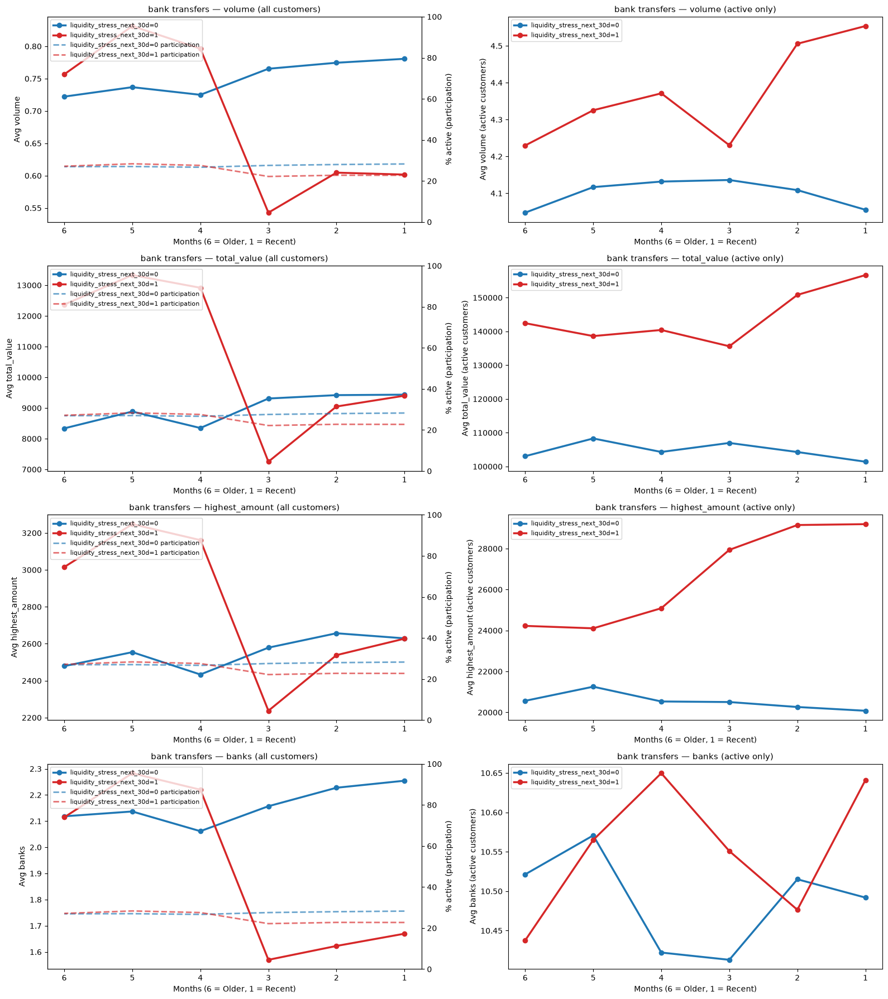

In [30]:
plot_monthly_evolution_v2(train, "transfer_from_bank", ["volume", "total_value", "highest_amount", "banks"], title="bank transfers")

In [ ]:
# def count_deterioration_signals(df, month, target=TARGET):
#     """
#     Per customer, counts how many behavioural channels show a "deteriorating"
#     signal that month: inactive in deposit/received/transfer_from_bank
#     (disengagement), OR elevated withdraw/merchantpay/paybill spend relative
#     to that customer's own m6 baseline (the "personal baseline" H6 refers to).

#     Only meaningful for months 1-5: m6 is the baseline itself, so the
#     "elevated vs m6" signals are structurally impossible to trigger there,
#     which would otherwise artificially depress month 6's count and make the
#     m6->m5 jump look like a real behavioural shift.
#     """
#     disengagement_channels = ["deposit", "received", "transfer_from_bank"]
#     elevated_channels = ["withdraw", "merchantpay", "paybill"]

#     signals = pd.Series(0, index=df.index)

#     for ch in disengagement_channels:
#         signals += (df[f"m{month}_{ch}_volume"] == 0).astype(int)

#     for ch in elevated_channels:
#         baseline = df[f"m6_{ch}_total_value"]
#         current = df[f"m{month}_{ch}_total_value"]
#         signals += (current > baseline * 1.2).astype(int)  # 20% above own m6 baseline

#     return signals


# rows = []
# for m in range(1, 6):  # m6 excluded -- see docstring
#     counts = count_deterioration_signals(train, m)
#     rows.append(pd.DataFrame({"month": m, TARGET: train[TARGET].values, "n_signals": counts.values}))
# signal_df = pd.concat(rows, ignore_index=True)

# fig, ax = plt.subplots(figsize=(8, 5))
# sns.lineplot(data=signal_df, x="month", y="n_signals", hue=TARGET, marker="o",
#              linewidth=2.5, estimator="mean", ax=ax)
# ax.set_xticks(range(1, 6))
# ax.invert_xaxis()
# ax.set_title("Count of simultaneous deterioration signals (m5 -> m1)")
# plt.tight_layout()
# plt.show()


### 3.6 Bivariate analysis feature vs feature

#### 3.6.1 Redundancy

##### 3.6.1.1 Temporal redundancy (same metric, across months)

In [32]:
X_monthly_collapsed = collapse_monthly_columns(train[f_tr])
print(f"{train[f_tr].shape[1]} raw features -> {X_monthly_collapsed.shape[1]} after collapsing monthly series")


182 raw features -> 66 after collapsing monthly series


##### 3.6.1.2 Cross-metric redundancy (different metrics, same month)

In [33]:
y = train[TARGET]

redundant_pairs = find_redundant_pairs(X_monthly_collapsed, threshold=0.9)
redundant_pairs


17 redundant pairs found (|spearman corr| >= 0.9) out of 1830 possible pairs across 61 features


,feature_1,feature_2,corr
0,transfer_from_bank_total_value_mean,transfer_from_bank_highest_amount_mean,0.963497
1,merchantpay_volume_mean,merchantpay_total_value_mean,0.958737
2,transfer_from_bank_volume_mean,transfer_from_bank_total_value_mean,0.952438
3,paybill_volume_mean,paybill_total_value_mean,0.950216
4,merchantpay_total_value_mean,merchantpay_highest_amount_mean,0.940568
5,transfer_from_bank_volume_mean,transfer_from_bank_highest_amount_mean,0.937605
6,paybill_total_value_mean,paybill_highest_amount_mean,0.932045
7,received_volume_mean,received_total_value_mean,0.927373
8,mm_send_volume_mean,mm_send_total_value_mean,0.927333
9,merchantpay_volume_mean,merchantpay_highest_amount_mean,0.916423


Before collapsing volume/total_value/highest_amount into a single representative metric per group, checking whether `highest_amount` is truly redundant or captures something the other two don't:

In [34]:

partial_corr_check = X_monthly_collapsed[
    ["deposit_volume_mean", "deposit_total_value_mean", "deposit_highest_amount_mean"]
].corr(method="spearman")
print(partial_corr_check)

for col in ["deposit_total_value_mean", "deposit_highest_amount_mean"]:
    r = X_monthly_collapsed[col].corr(y, method="spearman")
    print(f"{col}: corr with target = {r:.3f}")


                             deposit_volume_mean  deposit_total_value_mean  \
deposit_volume_mean                     1.000000                  0.904731   
deposit_total_value_mean                0.904731                  1.000000   
deposit_highest_amount_mean             0.851370                  0.909555   

                             deposit_highest_amount_mean  
deposit_volume_mean                             0.851370  
deposit_total_value_mean                        0.909555  
deposit_highest_amount_mean                     1.000000  
deposit_total_value_mean: corr with target = -0.062
deposit_highest_amount_mean: corr with target = -0.061


In [35]:
for group in ["withdraw", "paybill", "merchantpay", "mm_send", "received", "transfer_from_bank"]:
    tv_col = f"{group}_total_value_mean"
    ha_col = f"{group}_highest_amount_mean"
    if tv_col in X_monthly_collapsed.columns and ha_col in X_monthly_collapsed.columns:
        r_tv = X_monthly_collapsed[tv_col].corr(y, method="spearman")
        r_ha = X_monthly_collapsed[ha_col].corr(y, method="spearman")
        print(f"{group}: total_value={r_tv:.3f}, highest_amount={r_ha:.3f}, diff={abs(r_tv - r_ha):.3f}")


withdraw: total_value=-0.016, highest_amount=-0.037, diff=0.021
paybill: total_value=-0.022, highest_amount=-0.027, diff=0.005
merchantpay: total_value=-0.029, highest_amount=-0.032, diff=0.004
mm_send: total_value=-0.009, highest_amount=-0.018, diff=0.009
received: total_value=-0.059, highest_amount=-0.050, diff=0.009
transfer_from_bank: total_value=-0.043, highest_amount=-0.043, diff=0.000


Only `withdraw` shows a materially different correlation for `highest_amount` vs `total_value` (~2x in magnitude, the largest gap of the 7 groups) -- kept as the one exception when collapsing:

In [36]:
X_bivariate, dropped_cols = drop_redundant_mean_metrics(
    X_monthly_collapsed,
    keep_metric="total_value",
    exceptions={"withdraw": "highest_amount"}
)
print(f"{X_monthly_collapsed.shape[1]} -> {X_bivariate.shape[1]} features")


Dropping 13 redundant mean columns
66 -> 53 features


#### 3.6.2 Data-driven interaction discovery

Zero-inflated action groups: ['deposit', 'merchantpay', 'mm_send', 'paybill', 'received', 'transfer_from_bank', 'withdraw']


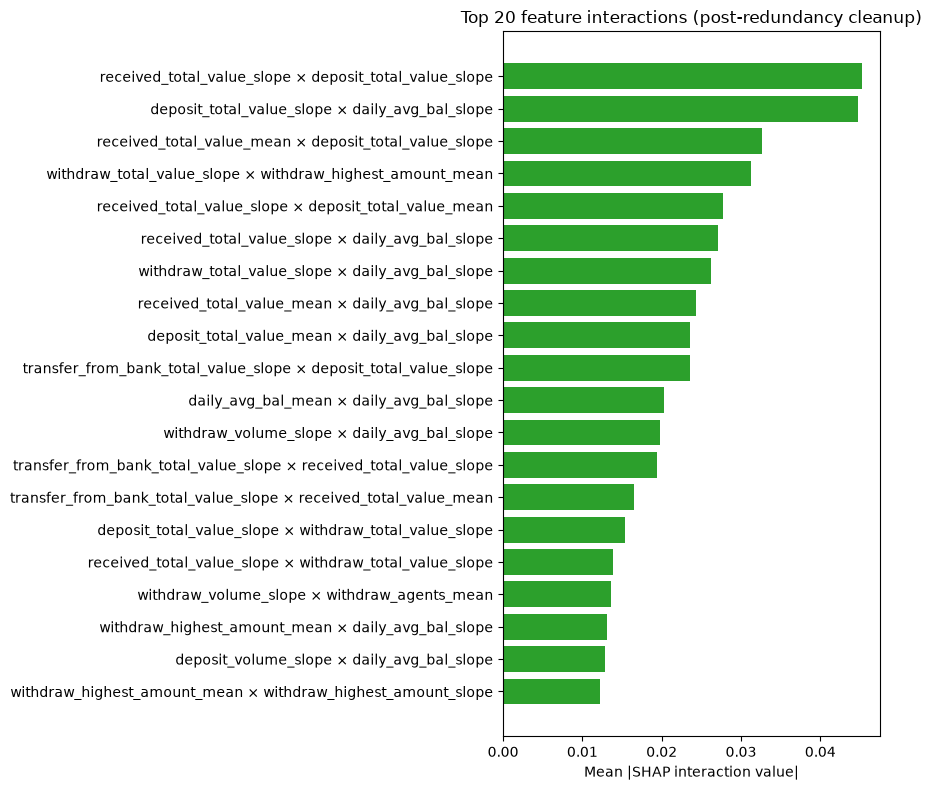

,feature_1,feature_2,interaction_strength
1212,received_total_value_slope,deposit_total_value_slope,0.045259
1311,deposit_total_value_slope,daily_avg_bal_slope,0.044800
1194,received_total_value_mean,deposit_total_value_slope,0.032602
1357,withdraw_total_value_slope,withdraw_highest_amount_mean,0.031231
1211,received_total_value_slope,deposit_total_value_mean,0.027770
1224,received_total_value_slope,daily_avg_bal_slope,0.027062
1362,withdraw_total_value_slope,daily_avg_bal_slope,0.026218
1206,received_total_value_mean,daily_avg_bal_slope,0.024384
1299,deposit_total_value_mean,daily_avg_bal_slope,0.023583
930,transfer_from_bank_total_value_slope,deposit_total_value_slope,0.023574


In [37]:

behaviour_ft = dic[dic["feature_group"] == "behaviour"]["column_name"].reset_index(drop=True).values
global_zero_rate = (train[behaviour_ft] == 0).mean()
target1_zero_rate = (train.loc[train[TARGET] == 1, behaviour_ft] == 0).mean()
zero_inflation_features = [
    col for col in behaviour_ft
    if global_zero_rate[col] > 0.5 or target1_zero_rate[col] > 0.4
]

known_suffixes = [
    "volume", "total_value", "highest_amount",
    "merchants", "companies", "agents", "recipients", "senders", "banks"
]
action_prefix_pattern = re.compile(rf"^m\d+_(.+)_(?:{'|'.join(known_suffixes)})$")

actions = sorted({
    m.group(1) for col in zero_inflation_features
    if (m := action_prefix_pattern.match(col))
})
print("Zero-inflated action groups:", actions)

y = train[TARGET]
neg, pos = (y == 0).sum(), (y == 1).sum()

cat_cols = X_bivariate.select_dtypes(include=["category", "object", "string"]).columns.tolist()
for c in cat_cols:
    X_bivariate[c] = X_bivariate[c].astype("category").cat.codes

model_bivariate = xgb.XGBClassifier(
    n_estimators=200, max_depth=4, learning_rate=0.05,
    subsample=0.8, colsample_bytree=0.8,
    scale_pos_weight=neg / pos, eval_metric="logloss",
    n_jobs=-1, random_state=42
)
model_bivariate.fit(X_bivariate, y)

sample_bivariate = X_bivariate.sample(n=min(2000, len(X_bivariate)), random_state=42)
explainer_bivariate = shap.TreeExplainer(model_bivariate)
interaction_values = explainer_bivariate.shap_interaction_values(sample_bivariate)

mean_abs_interaction = np.abs(interaction_values).mean(axis=0)
np.fill_diagonal(mean_abs_interaction, 0)

feature_names = X_bivariate.columns.tolist()
n = len(feature_names)
pairs = [
    (feature_names[i], feature_names[j], mean_abs_interaction[i, j])
    for i in range(n) for j in range(i + 1, n)
]
pairs_df = pd.DataFrame(pairs, columns=["feature_1", "feature_2", "interaction_strength"])
top_interactions = pairs_df.sort_values("interaction_strength", ascending=False).head(20)

fig, ax = plt.subplots(figsize=(9, 8))
labels = (top_interactions["feature_1"] + " × " + top_interactions["feature_2"])[::-1]
ax.barh(labels, top_interactions["interaction_strength"][::-1], color="#2ca02c")
ax.set_xlabel("Mean |SHAP interaction value|")
ax.set_title("Top 20 feature interactions (post-redundancy cleanup)")
plt.tight_layout()
plt.show()

top_interactions


#### 3.6.3 Correlations (target-conditional)

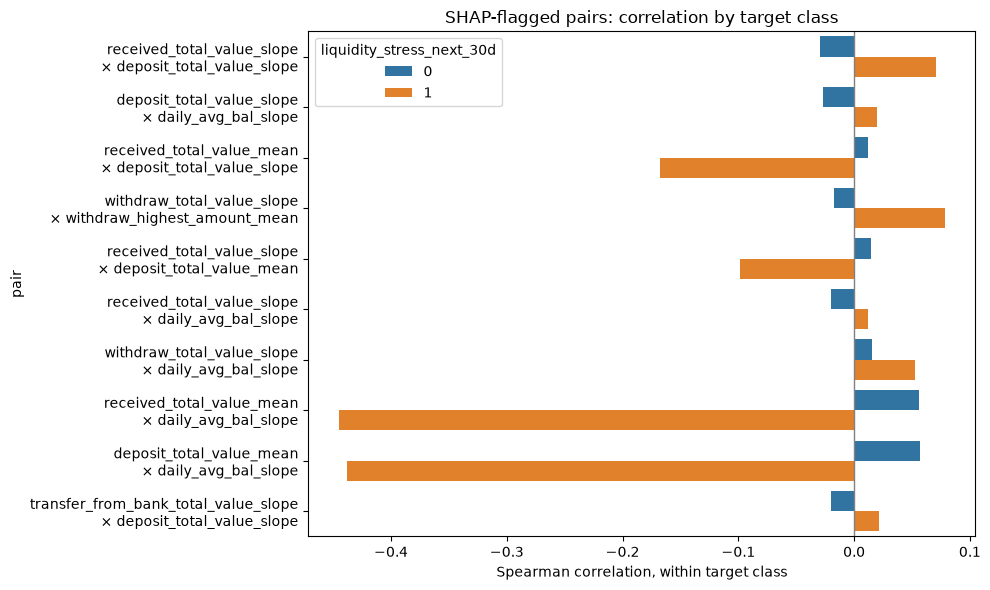

In [38]:
df_with_target = X_bivariate.assign(**{TARGET: y.values})
corr_summary = plot_top_interaction_correlations(df_with_target, top_interactions, top_n=10)


##### 3.6.3.1 Joint Participation

##### 3.6.3.2 Intensity

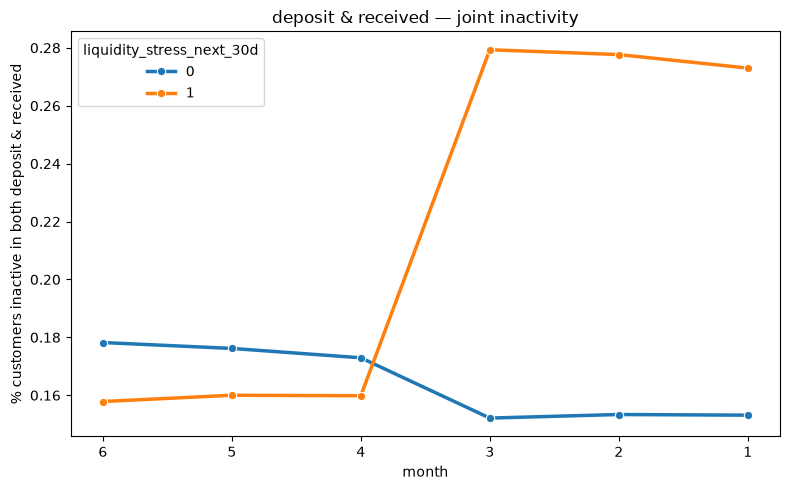

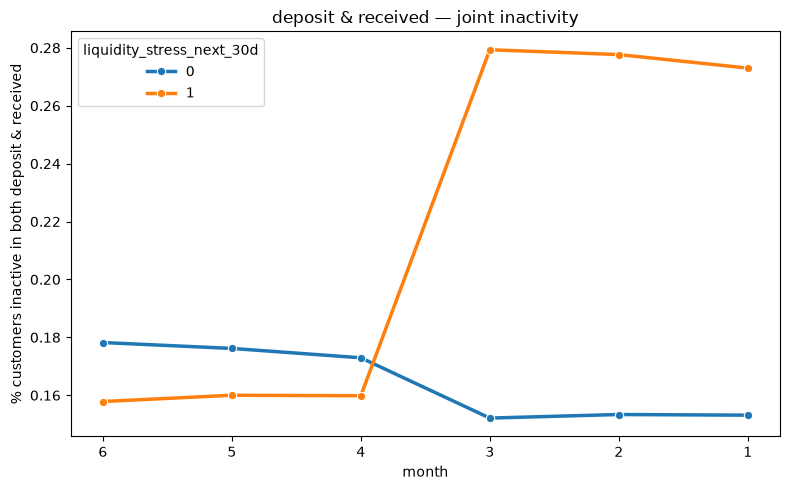

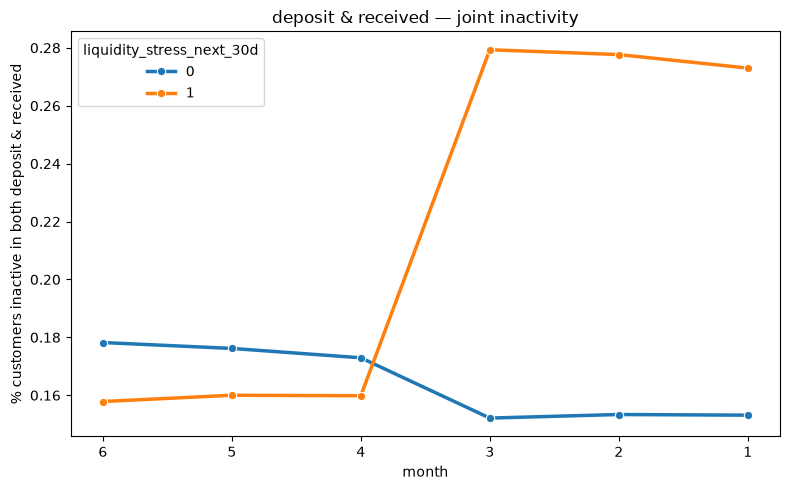

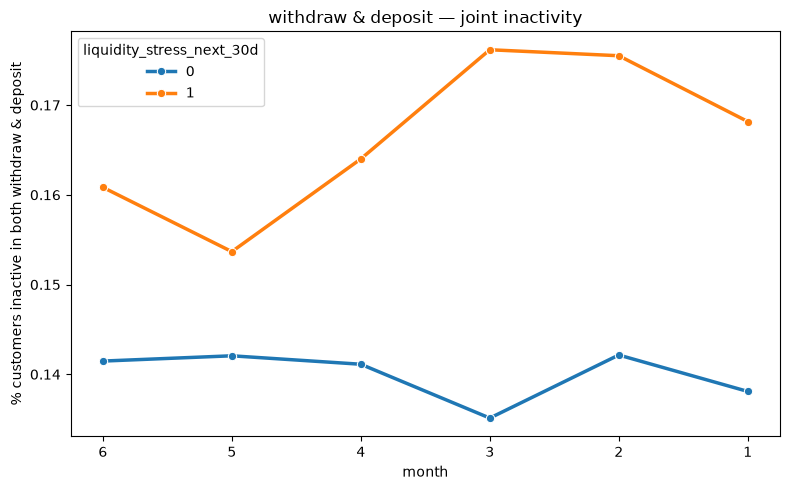

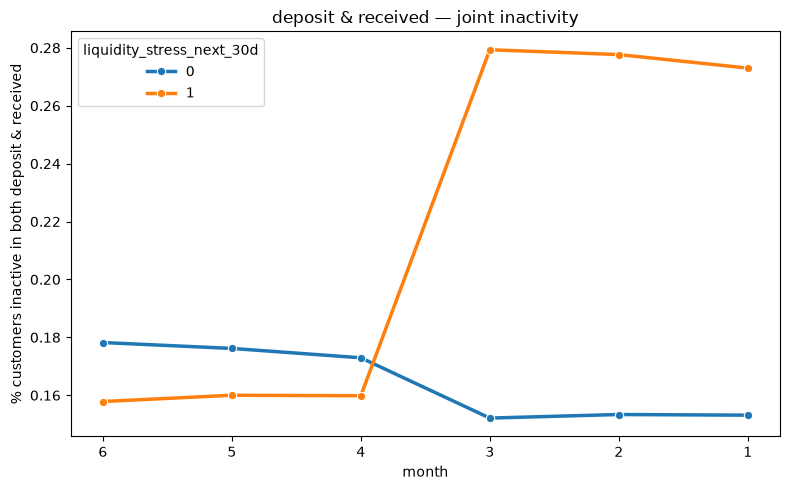

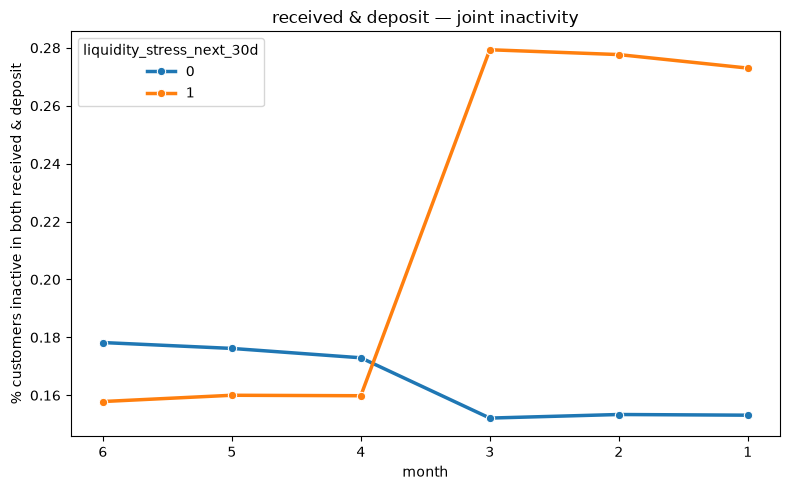

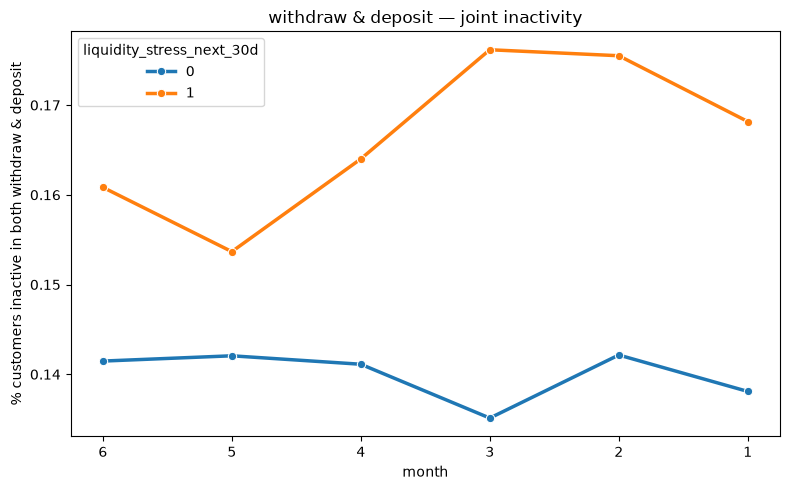

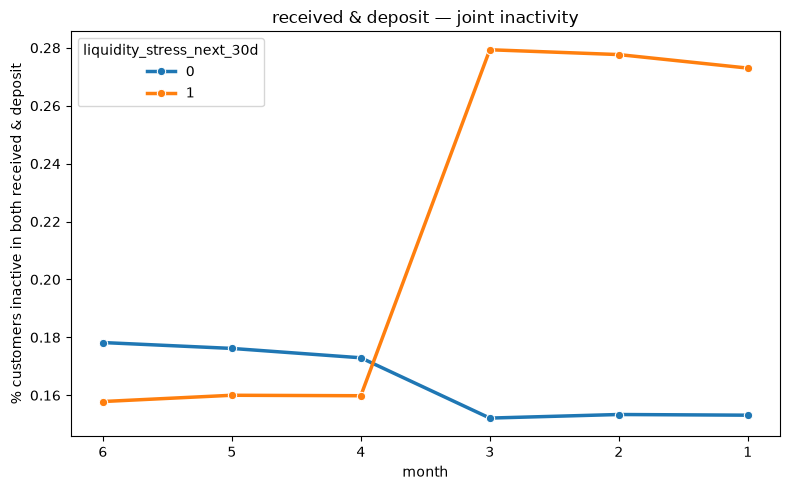

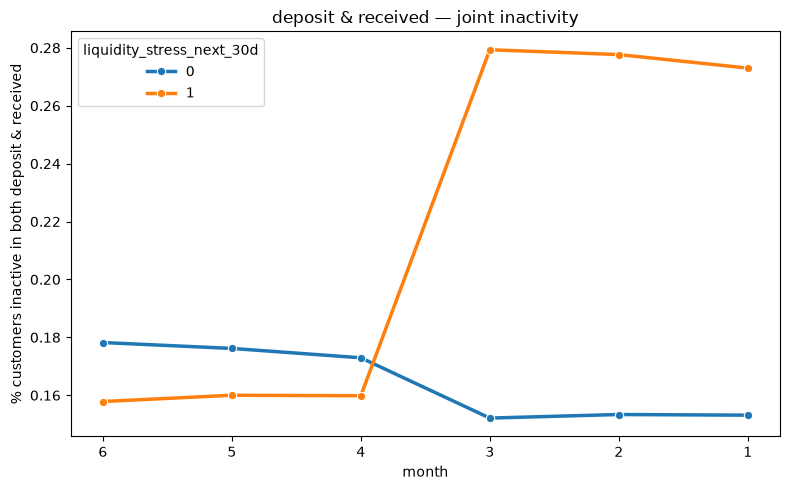

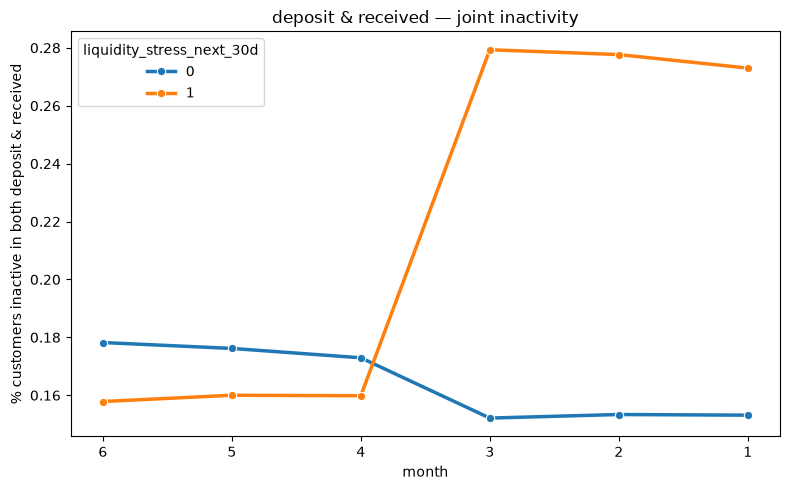

In [39]:
# only for top-SHAP pairs touching a zero-inflated group (actions, from 3.6.2)
zero_inflated_top_pairs = [
    (row["feature_1"], row["feature_2"])
    for _, row in top_interactions.head(10).iterrows()
    if any(action in row["feature_1"] or action in row["feature_2"] for action in actions)
]

for x_feat, y_feat in zero_inflated_top_pairs:
    action = next(a for a in actions if a in x_feat or a in y_feat)
    other = "received" if action == "deposit" else "deposit"  # avoid pairing action with itself
    plot_joint_inactivity_evolution(train, action, other, title=f"{action} & {other} — joint inactivity")
    # print(intensity_correlation_active_only(train, action, other))


Checking whether the joint inactivity found above says anything beyond what each variable's own (marginal) inactivity rate already shows:

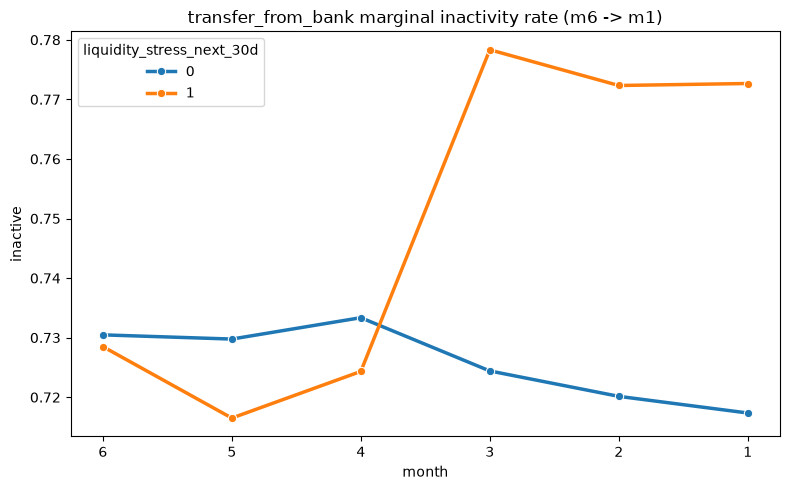

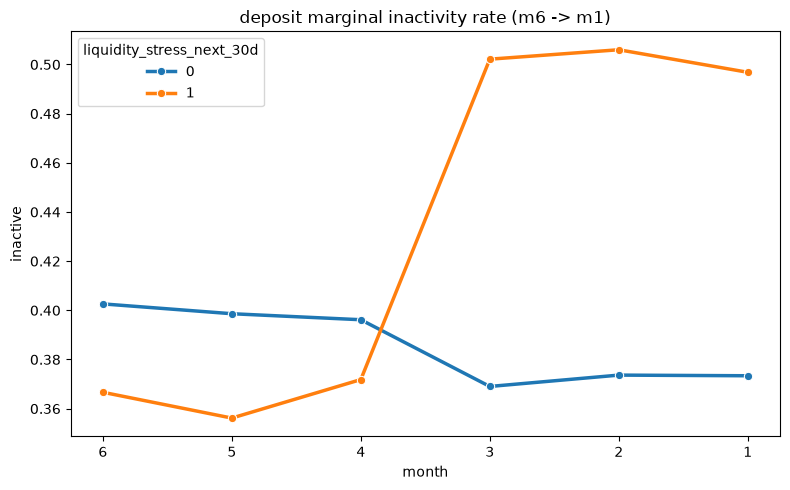

,month,liquidity_stress_next_30d,inactive
0,1,0,0.373382
1,1,1,0.496833
2,2,0,0.373647
3,2,1,0.506000
4,3,0,0.369029
5,3,1,0.502167
6,4,0,0.396176
7,4,1,0.371833
8,5,0,0.398618
9,5,1,0.356167


In [40]:
def plot_marginal_inactivity(df, prefix, participation_col="volume", target=TARGET, title=None):
    rows = []
    for m in range(1, 7):
        col = f"m{m}_{prefix}_{participation_col}"
        inactive = (df[col] == 0)
        rows.append(pd.DataFrame({"month": m, target: df[target].values, "inactive": inactive.values}))
    inact_df = pd.concat(rows, ignore_index=True)
    rate = inact_df.groupby(["month", target])["inactive"].mean().reset_index()

    fig, ax = plt.subplots(figsize=(8, 5))
    sns.lineplot(data=rate, x="month", y="inactive", hue=target, marker="o", linewidth=2.5, ax=ax)
    ax.set_xticks(range(1, 7))
    ax.invert_xaxis()
    ax.set_title(title or f"{prefix} marginal inactivity rate (m6 -> m1)")
    plt.tight_layout()
    plt.show()
    return rate

plot_marginal_inactivity(train, "transfer_from_bank")
plot_marginal_inactivity(train, "deposit")


##### 3.6.4 Same-month evolution (hypothesis-driven)

`correlation_diff_heatmap` and `plot_same_month_correlation` were defined earlier but never
invoked in this notebook -- this section closes that loop. They were originally meant to run
on `top_feature_names` (the top features by correlation with target), but that variable comes
from a "3.7 Correlation with Target" section that was never added to this notebook. Rather than
add a whole extra section just to feed this one, the candidates here are taken directly from
`top_interactions` (3.6.2) -- the same SHAP-flagged pairs already validated in 3.6.3, just
viewed through same-month correlation instead of a single pooled number.

Top SHAP-flagged pair, as monthly stems: received_total_value vs deposit_total_value


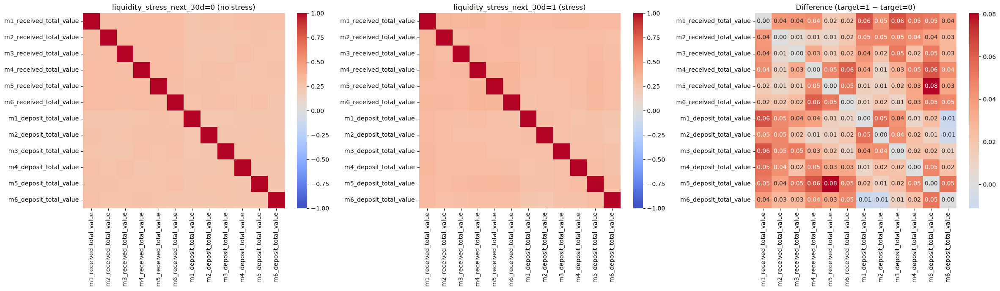

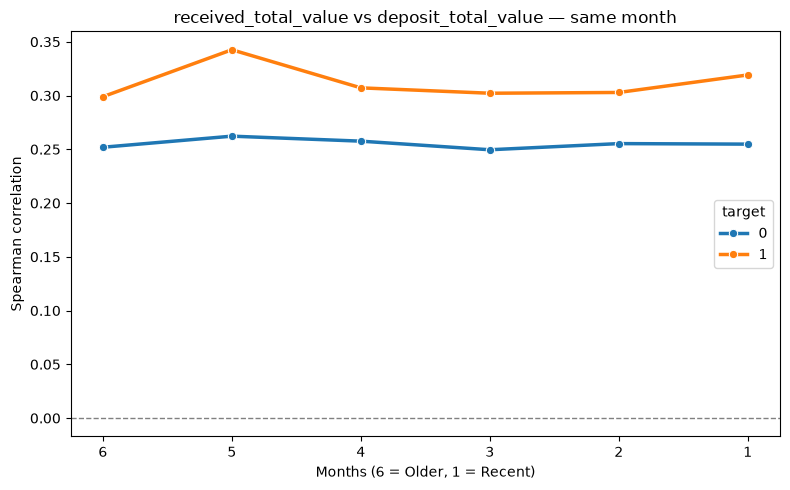

,month,target,corr
0,1,0,0.254800
1,1,1,0.319140
2,2,0,0.255293
3,2,1,0.302855
4,3,0,0.249569
5,3,1,0.302143
6,4,0,0.257569
7,4,1,0.307147
8,5,0,0.262213
9,5,1,0.342584


In [41]:
def strip_agg_suffix(feature_name):
    """Maps a collapsed feature (e.g. deposit_total_value_slope) back to its
    monthly column stem (deposit_total_value), so it can be looked up as
    m{1-6}_<stem> in the raw monthly data."""
    return re.sub(r"_(mean|slope)$", "", feature_name)


top_pair = top_interactions.iloc[0]
x_stem = strip_agg_suffix(top_pair["feature_1"])
y_stem = strip_agg_suffix(top_pair["feature_2"])
print(f"Top SHAP-flagged pair, as monthly stems: {x_stem} vs {y_stem}")

candidate_cols = [f"m{m}_{stem}" for stem in (x_stem, y_stem) for m in range(1, 7)]
corr_0, corr_1, diff = correlation_diff_heatmap(train, candidate_cols)
plot_same_month_correlation(corr_0, corr_1, x_stem, y_stem, title=f"{x_stem} vs {y_stem} — same month")


### 3.7 Hypothesis Evaluation

#### **H1 Reduced spending on goods and services — Reject**


Across all three metrics (volume, total_value, highest_amount), target=1 customers sit
*above* target=0 throughout the full 6-month window, in both the all-customers and
active-only views (3.5.1) — the opposite of what the hypothesis predicts.

A secondary pattern is worth noting even though it doesn't change the verdict: among
active customers, `volume` stays flat or slightly increases while `total_value` declines
toward m1, suggesting more frequent, smaller transactions rather than an overall drop in
spending.

#### **H2 Reduced bill payments — Reject**

As with H1, target=1 customers sit *above* target=0 across volume, total_value and
highest_amount throughout the full window (active only), the opposite of what the
hypothesis predicts.

Unlike merchantpay, the secondary pattern here is a broad decline across all three
metrics together toward m1 (not a volume/total_value split) -- consistent with
customers paying smaller bills overall as they approach the stress event, rather than
a shift toward more frequent, smaller transactions. `companies` shows no clear
separation between groups and is likely noise given its narrow range (4.42-4.55).

#### **H3 Reduced Cash inflows — Weak (participation-driven, not intensity-driven)**

The "all customers" average drops sharply for target=1 between m4 and m3 across volume,
total_value, highest_amount and agents -- but this coincides exactly with a drop in
participation (from ~65% to ~50%) at the same point, not a decline among active
depositors. 

Active-only, target=1 customers deposit the same or *more* than at the
start of the window (total_value and highest_amount both end higher than m6). The
mechanism behind H3 is customers dropping out of depositing entirely starting ~3
months before the stress window, not a gradual reduction in deposit behaviour among
active customers.

#### **H4: Increased cash withdrawals (withdraw) — Support**

Unlike H3 (deposit), this isn't purely participation-driven: active-only withdraw
customers in target=1 already show a substantially higher baseline across volume,
total_value and highest_amount from m6 onward -- a persistent trait, not a recent
shift. On top of that, participation itself rises for target=1 (~58% to ~68-70%)
starting at m3, reinforcing rather than explaining the jump seen in the
all-customers view. `agents` shows no meaningful separation and is likely noise
given its narrow range (2.98-3.03).

#### **H5: Increased external support (received + transfer_from_bank) — Support**



Both channels show the same participation drop at m3 (received: ~60%→50%; transfer_from_bank:
~27%→20%), matching the co-inactivity finding from 3.6.3.1 and reinforcing deposit's own m3
drop -- consistent evidence that m3 marks a broader disengagement point for a subset of
future-stressed customers, not noise specific to one variable.

Among active customers, however, both channels show a clear upward trend in the opposite
direction: received's active-only metrics climb toward m1 (with a sharp late spike), while
transfer_from_bank shows an even steadier, more pronounced rise across volume, total_value
and highest_amount (highest_amount alone up ~20% from m6 to m1, accelerating toward the end).

Net reading: customers heading toward stress receive external support *less often* as they
approach the event, but when they do, the transfers are larger and growing -- consistent with
occasional, escalating external support (family, bank assistance) rather than a steady safety
net. `senders` and `banks` show no clear separation and are likely noise.

#### **H6: Behavioural deterioration over time — Weak**

Rather than a standalone univariate test, the strongest evidence for H6 comes from
3.6.3's target-conditional correlation: the relationship between `daily_avg_bal_mean`
and `daily_avg_bal_slope` is nearly flat for target=0 (r≈0.07) but strongly negative
for target=1 (r≈-0.45). This means stressed customers' balance behaves inconsistently
relative to their own baseline level -- customers who start with a higher average
balance see it decline sharply, while those already low stay flat -- a pattern absent
in non-stressed customers. This is a genuine deviation-from-baseline signal, but it is
narrow: it was only tested for balance, not validated across other behavioural
channels.

An additional attempt to measure deterioration as an accumulating count of
simultaneous signals across channels (months 1-5, excluding the m6 baseline month
itself) shows target=0 and target=1 tracking almost identically through m5-m4,
diverging only at m3 and remaining flat afterward -- reproducing the same m3
disengagement already captured in H3/H5, rather than showing a distinct, progressively
accumulating pattern.

### The pattern behind the numbers


Three separate findings point to the same underlying story, rather than six independent behaviours:

1. **A synchronized disengagement point, not a gradual decline.** `deposit`, `received`, and `transfer_from_bank` all show a participation drop concentrated at the same month (m3) — three unrelated channels breaking at once is a stronger signal than any single one in isolation, and it directly explains why H3 and H5's "all customers" averages look dramatic while their "active only" views don't.

2. **A persistent trait, not a recent shift.** Unlike the m3 disengagement, `withdraw` shows an elevated baseline from m6 onward — future-stressed customers already withdraw more from the very start of the observation window, well before any month-to-month change appears.

3. **Higher spending, not lower.** Both `merchantpay` and `paybill` — the two channels most directly tied to everyday spending — move in the *opposite* direction to what the original hypotheses assumed, rejecting the simplest "customers cut back" narrative.

Put together: financial stress in this dataset does not look like broad, gradual belt-tightening. It looks like a small number of customers who were already withdrawing more than average, who then partially disengage from deposits and external transfers roughly 3 months before the stress window, while continuing — or even increasing — day-to-day spending. That combination (elevated outflow + shrinking inflow + unchanged spending) is a liquidity squeeze, consistent with the target's own definition (`liquidity_stress_next_30d`), rather than a spending-driven one.



### What carries forward to Part 2 (Feature Engineering & Modeling)

- The m3 disengagement point across deposit/received/transfer_from_bank → candidate for an explicit "months since last activity" or dropout-flag feature, likely more predictive than any trend slope.
- `withdraw`'s persistent elevated baseline → supports using level (`_mean`) features for withdraw, not just trend.
- The `daily_avg_bal_mean × daily_avg_bal_slope` divergence (H6) → candidate interaction feature, and a strong prior for including balance-related variables in the upcoming clustering step.
- The redundancy map from 3.6.1 → the feature set to start Part 2 from, avoiding re-introducing the collinearity already identified here.